# Analyses of sequence stereotypy

In [2]:
prefix = '/home/ines/repositories/'
# prefix = '/Users/ineslaranjeira/Documents/Repositories/'

In [3]:
""" 
IMPORTS
"""
import os
import numpy as np
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# --Machine learning and statistics

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler,  LabelBinarizer
import umap
from sklearn import mixture
import pickle
from scipy.stats import mode
from sklearn.metrics.pairwise import pairwise_distances
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import cosine
from sklearn.decomposition import PCA
from statsmodels.distributions.empirical_distribution import ECDF
from scipy.spatial import distance_matrix, distance
from scipy import stats

# Get my functions
functions_path =  prefix + 'representation_learning_variability/Functions/'
os.chdir(functions_path)
# from data_processing import save_and_log
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial//2_fit_models/'
os.chdir(functions_path)
from preprocessing_functions import idxs_from_files
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/5_clustering_analyses/'
os.chdir(functions_path)
# from clustering_functions import calculate_entropy
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial//3_postprocess_results/'
os.chdir(functions_path)
from plotting_functions import create_grouped_gradient_palette
from one.api import ONE
one = ONE(mode='remote')

In [113]:
data_path = prefix + 'representation_learning_variability/paper-individuality/fig1_segmentation/'
filename = str(data_path + 'all_sequences_09-29-2025')
all_sequences = pd.read_parquet(filename)
all_sequences['session'] = all_sequences['sample'].str[:36]
design_df = all_sequences.pivot(index=['sample', 'trial_type', 'mouse_name', 'session'], columns=['broader_label'], values='binned_sequence').reset_index().dropna()

data_path = prefix + 'representation_learning_variability/paper-individuality/fig4_clustering/'

trial_cluster = pd.read_parquet(data_path+'9_cluster_per_trial')
session_cluster = pd.read_parquet(data_path+'6_cluster_per_session')
# mouse_cluster = pd.read_parquet(data_path+'5_cluster_per_mouse_trial')

In [114]:
# complete_df = design_df.merge(trial_cluster[['sample', 'trial_cluster']].drop_duplicates(), on='sample')
complete_df = design_df.merge(session_cluster[['session', 'session_cluster']].drop_duplicates(), on='session')
# complete_df = complete_df.merge(mouse_cluster[['mouse_name', 'mouse_cluster']].drop_duplicates(), on='mouse_name')

In [115]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']
sequences_choice = np.vstack(complete_df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
X = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]

In [116]:
complete_df['feature_vector'] = list(sequences_choice)

# Select mice

In [117]:
data_path = prefix + 'representation_learning_variability/paper-individuality/fig4_clustering/'
# states_file = pd.read_parquet(data_path+'states_trial_type_5k_5_09-24-2025')
entropy_data = pd.read_parquet(data_path+'cluster_entropy')
entropy_data = entropy_data.replace([np.inf, -np.inf], np.nan).dropna(axis=0)


In [56]:
high_stereo = entropy_data.loc[entropy_data['norm_dif']>0.4, 'mouse_name'].drop_duplicates()


(array([   3.,    4.,   21.,  418.,  415.,  330.,  488.,  282.,  595.,
        2041.]),
 array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <BarContainer object of 10 artists>)

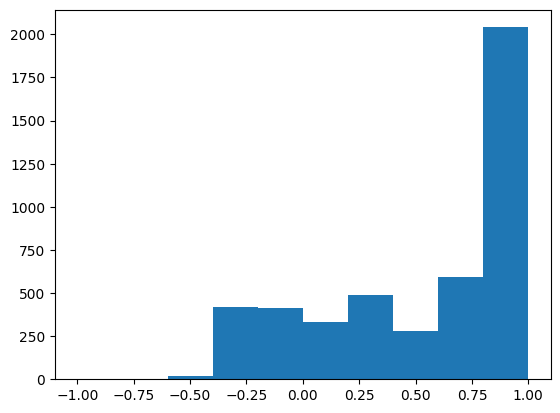

In [59]:
plt.hist(entropy_data.norm_dif)

In [118]:
session_count = complete_df[['mouse_name', 'session']].drop_duplicates().groupby(['mouse_name'])['session'].count().reset_index()
multi_sess_mice = session_count.loc[session_count['session']>1, 'mouse_name']

Text(0, 0.5, 'Number of mice')

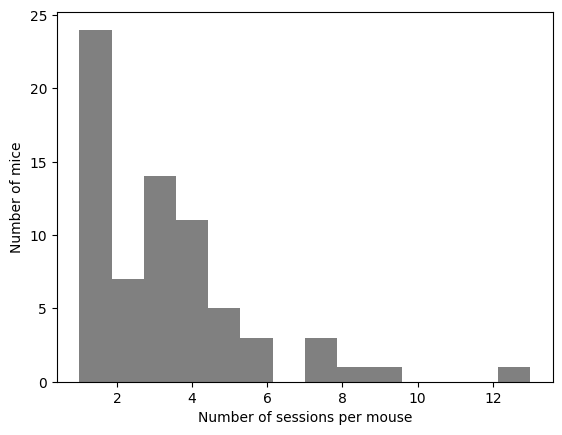

In [44]:
plt.hist(session_count['session'], color='Grey', bins=14)
plt.xlabel('Number of sessions per mouse')
plt.ylabel('Number of mice')

# New consensus cluster

In [161]:
temp = complete_df[['mouse_name', 'session', 'session_cluster']].drop_duplicates()
import statistics

dominant_cluster = temp.groupby('mouse_name')['session_cluster'].apply(lambda x: statistics.mode(x)).rename('dominant_cluster').reset_index()

In [162]:
complete_df = complete_df.merge(dominant_cluster, on='mouse_name')

In [119]:
def pseudo_label(df, label):
    shuffled_labels = np.random.permutation(df[label].values)
    df['shuffled'] = shuffled_labels

    return df

In [120]:
def pseudo_label_preserve(df, label, preserve):
    session_clusters = df.groupby(preserve)[label].first()

    # Step 2: Shuffle cluster labels across sessions
    shuffled_session_clusters = session_clusters.sample(frac=1).values

    # Step 3: Map shuffled labels back to sessions
    session_to_new_cluster = dict(zip(session_clusters.index, shuffled_session_clusters))

    # Step 4: Assign new clusters back to each trial
    df['shuffled'] = df[preserve].map(session_to_new_cluster)

    return df

In [186]:
hamming_df = complete_df.copy()

# # Exlude mice without duplicate sessions
# hamming_df = hamming_df.loc[hamming_df['mouse_name'].isin(multi_sess_mice) & 
#                             (hamming_df['mouse_name'].isin(high_stereo))]

hamming_df = hamming_df.loc[hamming_df['mouse_name'].isin(multi_sess_mice) ]


var_interest = 'mouse_name'
pres = True
preserve = 'session'

hamming_df['type'] = hamming_df['trial_type'].str.split().str[:1].str.join('')
hamming_df['y'] = hamming_df[var_interest] #+ hamming_df['mouse_name'].astype(str)
# hamming_df['session_cluster'] = hamming_df['session_cluster'].astype(str) 

sequence_types = hamming_df['y'].unique()
# len_matrix = 19900  # 4950
num_samples = 200
n_repeats = 100

distances_df = pd.DataFrame(columns=['repeat', 'type', 'ham_dist', 'ham_dist_mean', 
                                     'shuffle', 'shuffle_mean', 'pseudo_dist', 'pseudo_dist_mean'])
if pres:
    pseudo_df = pseudo_label_preserve(hamming_df.copy(), var_interest, preserve)
else:
    pseudo_df = pseudo_label(hamming_df.copy(), var_interest)
# pseudo_df = pseudo_label_preserve(hamming_df.copy(), var_interest, preserve)
pseudo_df['y'] = pseudo_df['shuffled']

for s, stype in enumerate(sequence_types):

    # Type
    use_data = hamming_df.loc[hamming_df['y']==stype]
    X = np.vstack(use_data['feature_vector'].apply(lambda x: np.array(x)).values)
    X_final = X[~np.isnan(X).any(axis=1), :].astype(int)

    # Shuffle
    shuffle_data = hamming_df.copy()
    X_shuffle = np.vstack(shuffle_data['feature_vector'].apply(lambda x: np.array(x)).values)
    X_final_shuffle = X_shuffle[~np.isnan(X_shuffle).any(axis=1), :].astype(int)

    # Pseudo
    use_pseudo = pseudo_df.loc[pseudo_df['y']==stype]
    X_pseudo = np.vstack(use_pseudo['feature_vector'].apply(lambda x: np.array(x)).values)
    X_final_pseudo = X_pseudo[~np.isnan(X_pseudo).any(axis=1), :].astype(int)
    
    temp_df = pd.DataFrame(columns=['repeat', 'type', 'ham_dist', 'ham_dist_mean', 
                                    'shuffle', 'shuffle_mean', 'pseudo_dist', 'pseudo_dist_mean'], index=range(n_repeats))
    for r in range(n_repeats):
        if len(X_final) > num_samples:

            # Sample from type
            indices = np.random.choice(X_final.shape[0], num_samples, replace=False)  # Random indices
            subsampled_matrix = X_final[indices]
            # Sample from random
            indices_shuffle = np.random.choice(X_final_shuffle.shape[0], num_samples, replace=False)  # Random indices
            subsampled_matrix_shuffle = X_final_shuffle[indices_shuffle]
            # Sample from pseudo type
            indices_pseudo = np.random.choice(X_final_pseudo.shape[0], num_samples, replace=False)  # Random indices
            subsampled_matrix_pseudo = X_final_pseudo[indices_pseudo]

            hamming_matrix = distance.pdist(subsampled_matrix.astype(np.uint8), metric='hamming')
            hamming_matrix_shuffle = distance.pdist(subsampled_matrix_shuffle.astype(np.uint8), metric='hamming')
            hamming_matrix_pseudo = distance.pdist(subsampled_matrix_pseudo.astype(np.uint8), metric='hamming')
            
            # Save results
            temp_df['repeat'][r] = r
            temp_df['type'][r] = stype
            temp_df['ham_dist'][r] = hamming_matrix
            temp_df['ham_dist_mean'][r] = np.mean(hamming_matrix)
            temp_df['shuffle'][r] = hamming_matrix_shuffle
            temp_df['shuffle_mean'][r] = np.mean(hamming_matrix_shuffle)
            temp_df['pseudo_dist'][r] = hamming_matrix_pseudo
            temp_df['pseudo_dist_mean'][r] = np.mean(hamming_matrix_pseudo)

            print('Repeat '+str(r)+' done')
    distances_df = pd.concat([distances_df, temp_df])

distances_df['diff'] = distances_df['shuffle'] - distances_df['ham_dist']


/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repeat 67 done
Repeat 68 done
Repeat 69 done
Repeat 70 done
Repeat 71 done
Repeat 72 done
Repeat 73 done
Repeat 74 done
Repeat 75 done
Repeat 76 done
Repeat 77 done
Repeat 78 done
Repeat 79 done
Repeat 80 done
Repeat 81 done
Repeat 82 done
Repeat 83 done
Repeat 84 done
Repeat 85 done
Repeat 86 done
Repeat 87 done
Repeat 88 done
Repeat 89 done
Repeat 90 done
Repeat 91 done
Repeat 92 done
Repeat 93 done
Repeat 94 done
Repeat 95 done
Repeat 96 done
Repeat 97 done
Repeat 98 done
Repeat 99 

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repeat 67 done
Repeat 68 done
Repeat 69 done
Repeat 70 done
Repeat 71 done
Repeat 72 done
Repeat 73 done
Repeat 74 done
Repeat 75 done
Repeat 76 done
Repeat 77 done
Repeat 78 done
Repeat 79 done
Repeat 80 done
Repeat 81 done
Repeat 82 done
Repeat 83 done
Repeat 84 done
Repeat 85 done
Repeat 86 done
Repeat 87 done
Repeat 88 done
Repeat 89 done
Repeat 90 done
Repeat 91 done
Repeat 92 done
Repeat 93 done
Repeat 94 done
Repeat 95 done
Repeat 96 done
Repeat 97 done
Repeat 98 done
Repeat 99 done


/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

/tmp/ipykernel_19325/3026599360.py:69: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  temp_df['repeat'][r] = r
/tmp/ipykernel_19325/3026599360.py:70: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Repeat 0 done
Repeat 1 done
Repeat 2 done
Repeat 3 done
Repeat 4 done
Repeat 5 done
Repeat 6 done
Repeat 7 done
Repeat 8 done
Repeat 9 done
Repeat 10 done
Repeat 11 done
Repeat 12 done
Repeat 13 done
Repeat 14 done
Repeat 15 done
Repeat 16 done
Repeat 17 done
Repeat 18 done
Repeat 19 done
Repeat 20 done
Repeat 21 done
Repeat 22 done
Repeat 23 done
Repeat 24 done
Repeat 25 done
Repeat 26 done
Repeat 27 done
Repeat 28 done
Repeat 29 done
Repeat 30 done
Repeat 31 done
Repeat 32 done
Repeat 33 done
Repeat 34 done
Repeat 35 done
Repeat 36 done
Repeat 37 done
Repeat 38 done
Repeat 39 done
Repeat 40 done
Repeat 41 done
Repeat 42 done
Repeat 43 done
Repeat 44 done
Repeat 45 done
Repeat 46 done
Repeat 47 done
Repeat 48 done
Repeat 49 done
Repeat 50 done
Repeat 51 done
Repeat 52 done
Repeat 53 done
Repeat 54 done
Repeat 55 done
Repeat 56 done
Repeat 57 done
Repeat 58 done
Repeat 59 done
Repeat 60 done
Repeat 61 done
Repeat 62 done
Repeat 63 done
Repeat 64 done
Repeat 65 done
Repeat 66 done
Repea

In [187]:
mouse_distances = pd.melt(distances_df, id_vars=['type', 'repeat'], value_vars=['ham_dist_mean', 'pseudo_dist_mean'])
mouse_distances.loc[mouse_distances['variable']=='ham_dist_mean', 'variable'] = 'Mouse'
mouse_distances.loc[mouse_distances['variable']=='pseudo_dist_mean', 'variable'] = 'Pseudo mouse'

In [188]:
session_cluster_distances.loc[session_cluster_distances['variable']=='Mouse', 'variable'] = 'remove'
session_cluster_distances.loc[session_cluster_distances['variable']=='Pseudo mouse', 'variable'] = 'remove'

In [184]:
palette_30 = create_grouped_gradient_palette(n_groups=5, shades_per_group=2, base_palette='Set1')
palette_30_list = [palette_30(i) for i in range(palette_30.N)]  # Extract colors properly

/tmp/ipykernel_19325/3822266930.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='variable', y='value', order=['Trial type', 'Random trial', 'Session', 'Random session', 'Session cluster',


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Trial type'),
  Text(1, 0, 'Random trial'),
  Text(2, 0, 'Session'),
  Text(3, 0, 'Random session'),
  Text(4, 0, 'Session cluster'),
  Text(5, 0, 'Pseudo session cluster'),
  Text(6, 0, 'Mouse'),
  Text(7, 0, 'Pseudo mouse'),
  Text(8, 0, 'Mouse cluster'),
  Text(9, 0, 'Pseudo mouse cluster')])

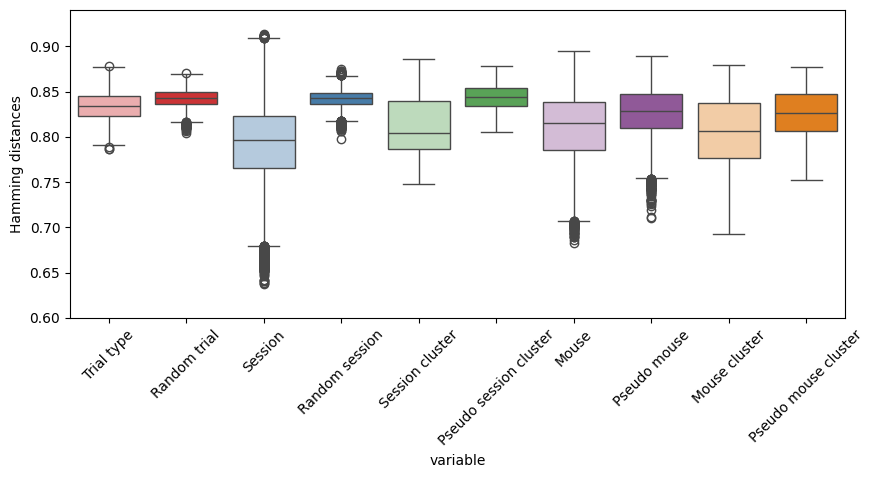

In [190]:
fig, ax = plt.subplots(figsize=(10,4))
sns.boxplot(x='variable', y='value', order=['Trial type', 'Random trial', 'Session', 'Random session', 'Session cluster',
       'Pseudo session cluster', 'Mouse', 'Pseudo mouse', 'Mouse cluster', 'Pseudo mouse cluster'], 
            data=session_cluster_distances.reset_index(), palette=palette_30_list)
plt.ylim([.6, .94])
plt.ylabel('Hamming distances')
plt.xticks(rotation=45)


In [189]:
session_cluster_distances = pd.concat([session_cluster_distances, mouse_distances])

In [166]:
session_cluster_distances.variable.unique()

array(['Session', 'Random session', 'Session cluster',
       'Pseudo session cluster', 'Mouse', 'Pseudo mouse', 'Trial type',
       'Random trial', 'Mouse cluster', 'Random cluster'], dtype=object)

In [83]:
distances_df['session'] = distances_df['type']
distances_df = distances_df.merge(complete_df[['mouse_name', 'session']].drop_duplicates(), on='session')

Text(0.5, 1.0, 'Pseudo clusters')

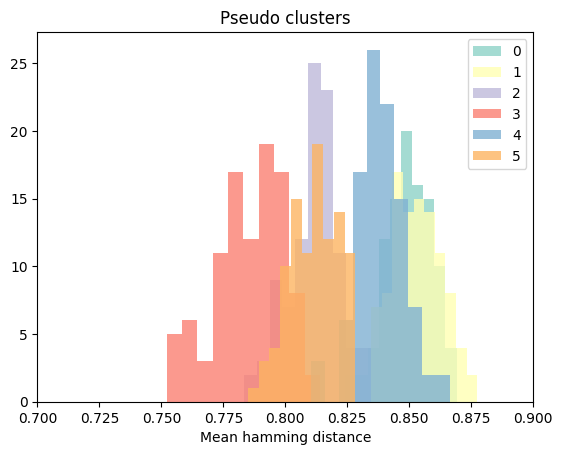

In [172]:
palette = sns.color_palette("Set3", 70, as_cmap=False)
# palette = sns.color_palette("Blues", 5, as_cmap=False)

# for t, type in enumerate(['0.0', '0.0625', '0.125', '0.25', '1.0']):
#for t, type in enumerate(distances_df['type'].unique()):
for t, type in enumerate([0, 1, 2, 3, 4, 5]):
    # for t, type in enumerate(distances_df['type'].unique()):
    plt.hist(distances_df.loc[distances_df['type']==type, 'pseudo_dist_mean'], 
             color=palette[t], alpha=0.8, bins=10, label=type)
    plt.xlim([0.7, .9])
plt.legend()
plt.xlabel('Mean hamming distance')
plt.title('Pseudo clusters')

Text(0.5, 1.0, 'True clusters')

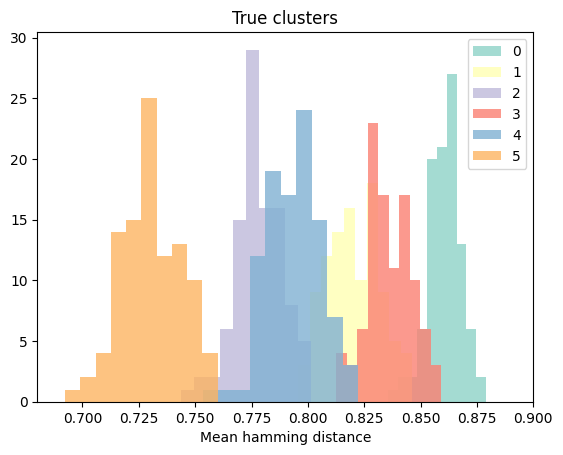

In [173]:
palette = sns.color_palette("Set3", 70, as_cmap=False)
# palette = sns.color_palette("Blues", 5, as_cmap=False)

# for t, type in enumerate(['0.0', '0.0625', '0.125', '0.25', '1.0']):
# for t, type in enumerate([0, 1, 2, 3, 4, 5]):
# for t, type in enumerate(distances_df['type'].unique()):
for t, type in enumerate([0, 1, 2, 3, 4, 5]):

    plt.hist(distances_df.loc[distances_df['type']==type, 'ham_dist_mean'], 
             color=palette[t], alpha=0.8, bins=10, label=type)
    plt.xlim([0.68, 0.9])
plt.legend()
plt.xlabel('Mean hamming distance')
plt.title('True clusters')

In [103]:
means = distances_df.groupby(['mouse_name', 'session'])[['ham_dist_mean', 'pseudo_dist_mean']].mean().reset_index()
stds = distances_df.groupby(['mouse_name', 'session'])[['ham_dist_mean', 'pseudo_dist_mean']].std().reset_index()
mouse_mean = means.groupby(['mouse_name'])[['ham_dist_mean', 'pseudo_dist_mean']].mean().reset_index()
mouse_std = means.groupby(['mouse_name'])[['ham_dist_mean', 'pseudo_dist_mean']].std().reset_index()

TtestResult(statistic=np.float64(-4.849899139076614), pvalue=np.float64(1.513758954696341e-05), df=np.int64(45))

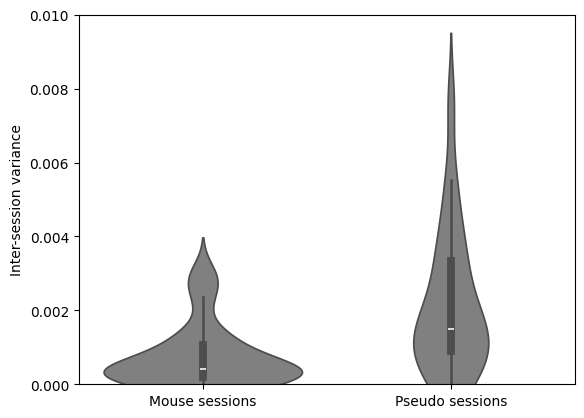

In [140]:
melted = pd.melt(mouse_std, id_vars=['mouse_name'], value_vars=['ham_dist_mean', 'pseudo_dist_mean'])
melted['value'] = melted['value']**2
sns.violinplot(x='variable', y='value', data=melted, color='grey')
plt.ylabel('Inter-session variance')
plt.xlabel('')
plt.ylim([0, 0.01])
plt.xticks(['ham_dist_mean', 'pseudo_dist_mean'], ['Mouse sessions', 'Pseudo sessions'])
stats.ttest_rel(mouse_std['ham_dist_mean']**2, mouse_std['pseudo_dist_mean']**2)

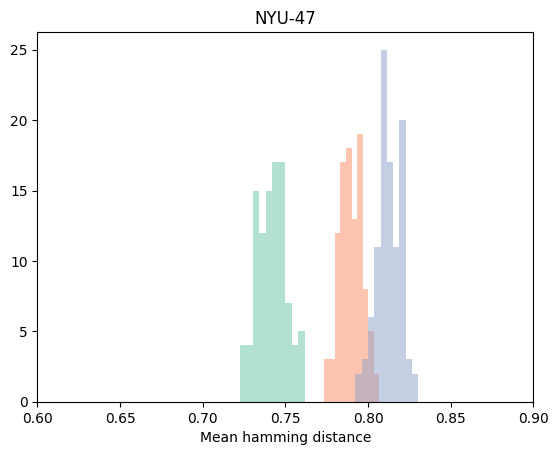

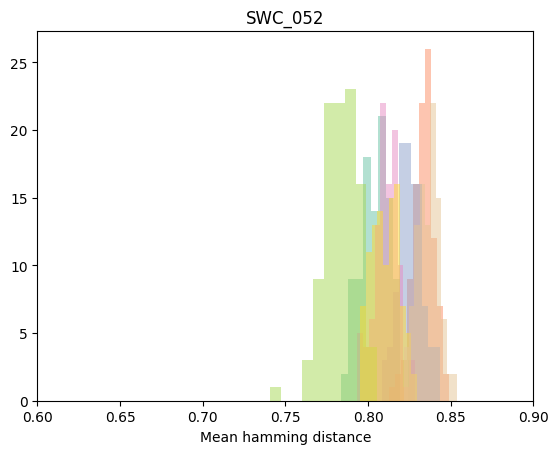

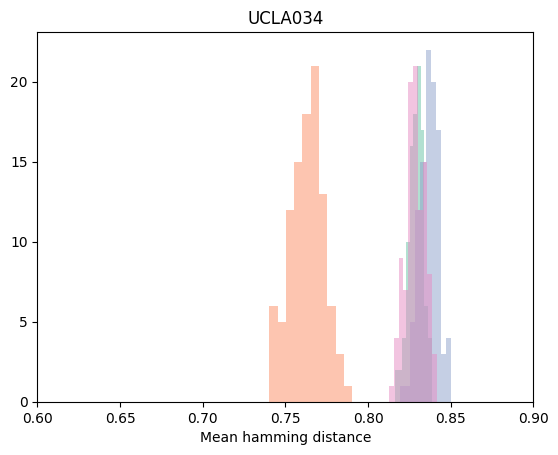

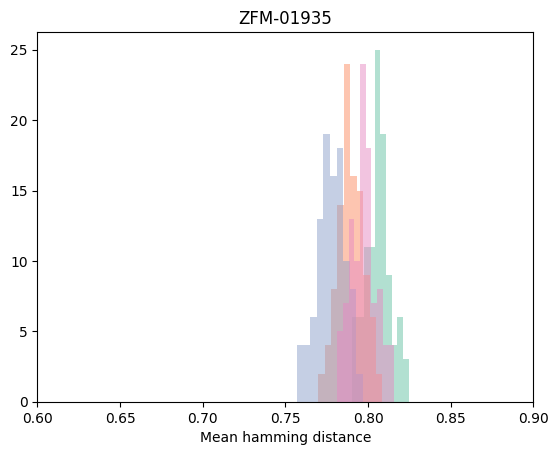

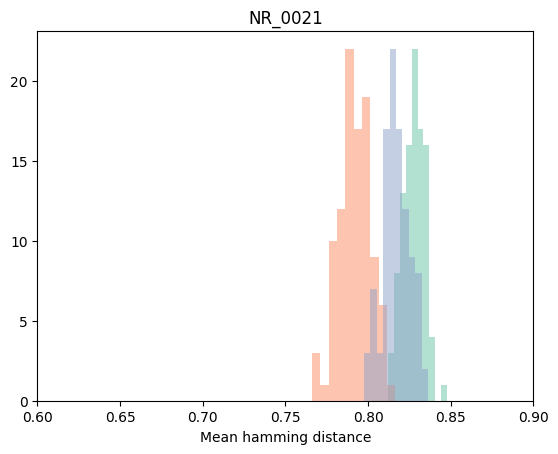

...

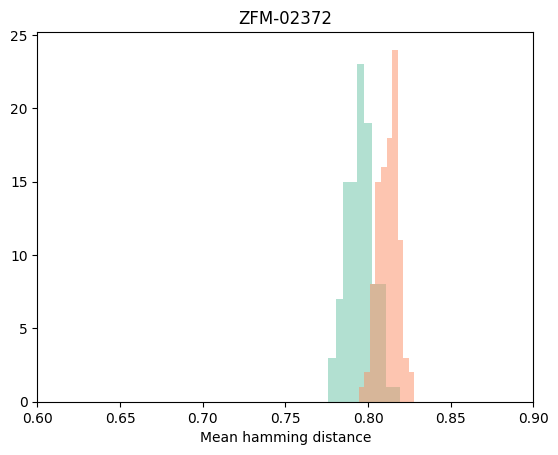

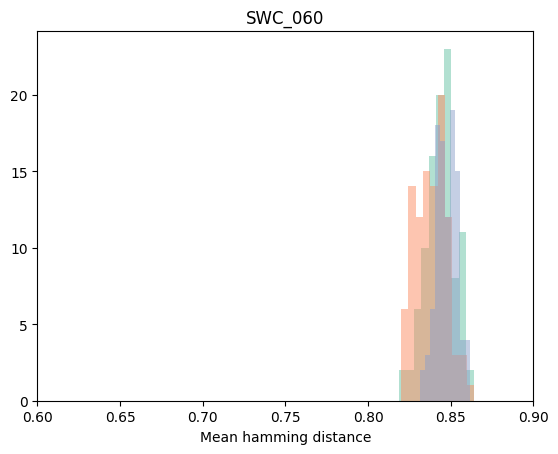

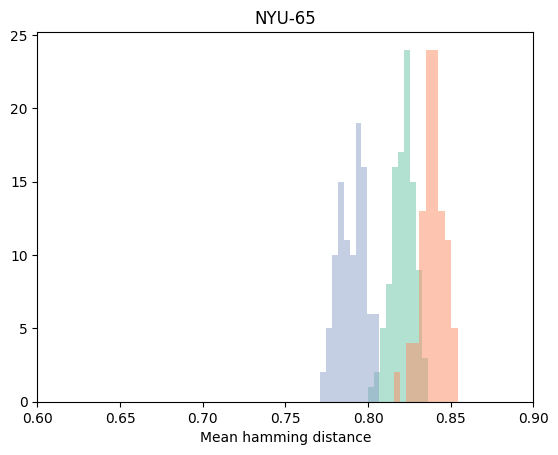

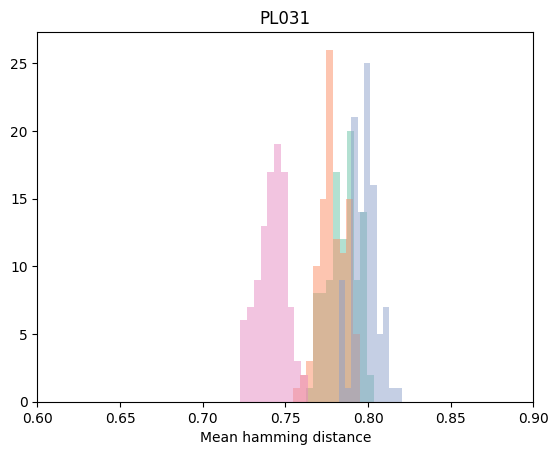

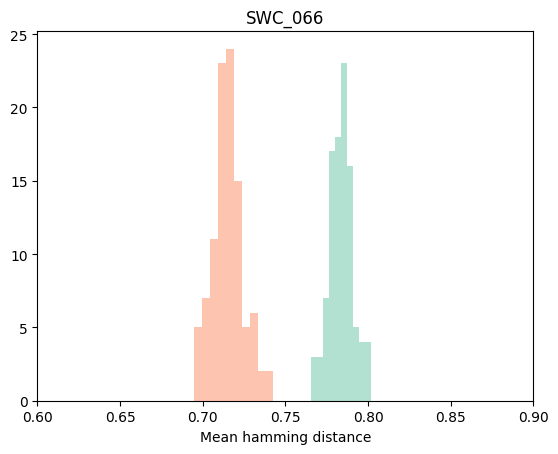

In [143]:
palette = sns.color_palette("Set2", 70, as_cmap=False)
# palette = sns.color_palette("Blues", 5, as_cmap=False)

# for t, type in enumerate(['0.0', '0.0625', '0.125', '0.25', '1.0']):
# for t, type in enumerate([0, 1, 2, 3, 4, 5]):
for m, mouse in enumerate(distances_df['mouse_name'].unique()[10:]):
    mouse_data = distances_df.loc[distances_df['mouse_name']==mouse]
    mouse_sessions = mouse_data['session'].unique()
    for s, session in enumerate(mouse_sessions):
        plt.hist(mouse_data.loc[mouse_data['session']==session, 'ham_dist_mean'], 
                color=palette[s], alpha=0.5, bins=10, label=type) 
        plt.xlim([0.6, 0.9])
        # plt.legend()
        plt.xlabel('Mean hamming distance')
        plt.title(mouse)
    # for s, session in enumerate(mouse_sessions):
    #     plt.hist(mouse_data.loc[mouse_data['session']==session, 'pseudo_dist_mean'], 
    #             color='grey', alpha=0.3, bins=10, label=type) #ham_dist_mean
    #     plt.xlim([0.6, 0.9])
    #     # plt.legend()
    #     plt.xlabel('Mean hamming distance')
    #     plt.title('True clusters')
    plt.show()

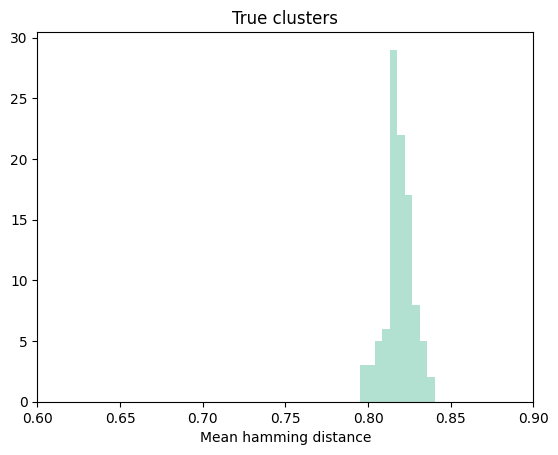

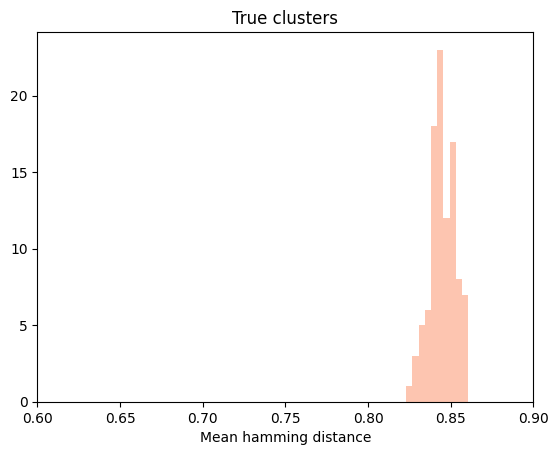

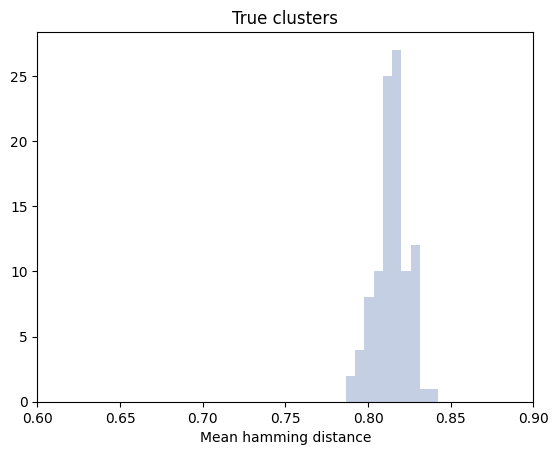

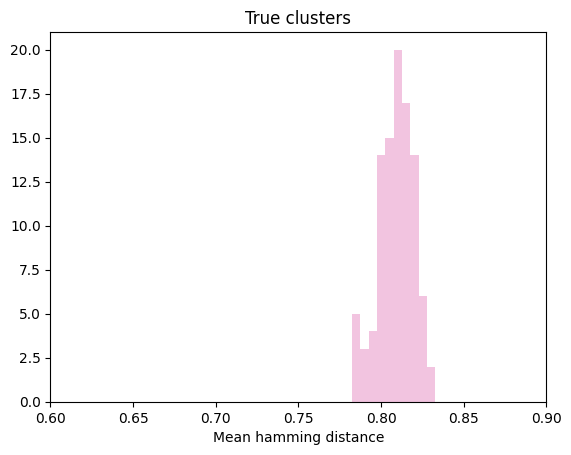

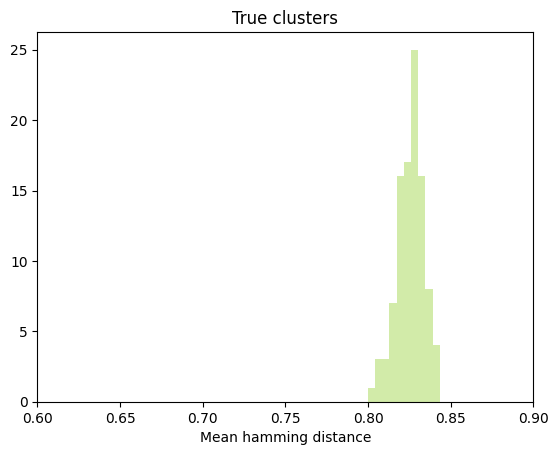

...

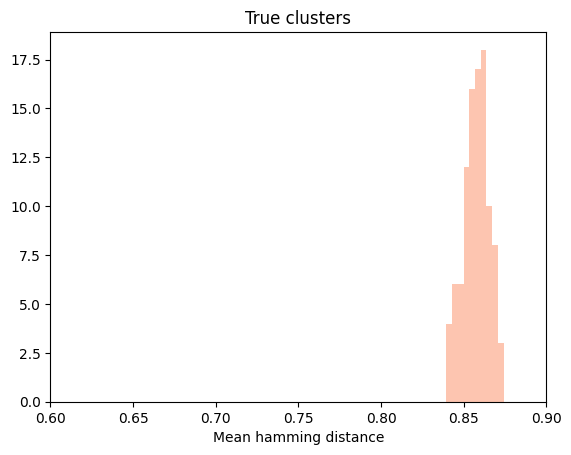

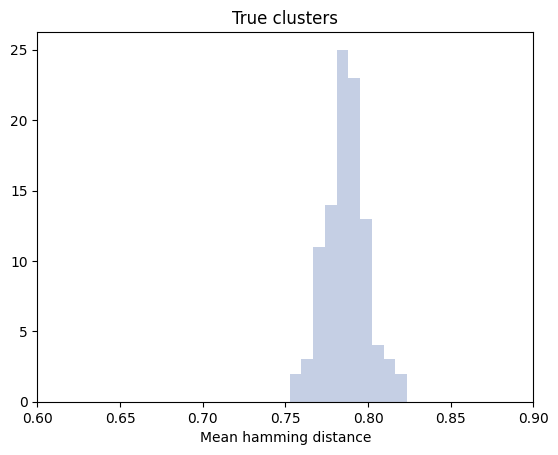

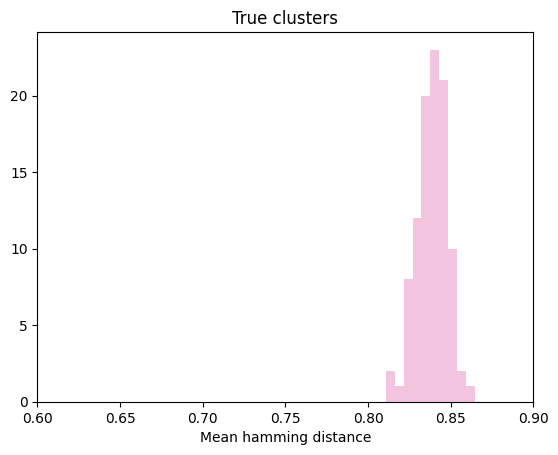

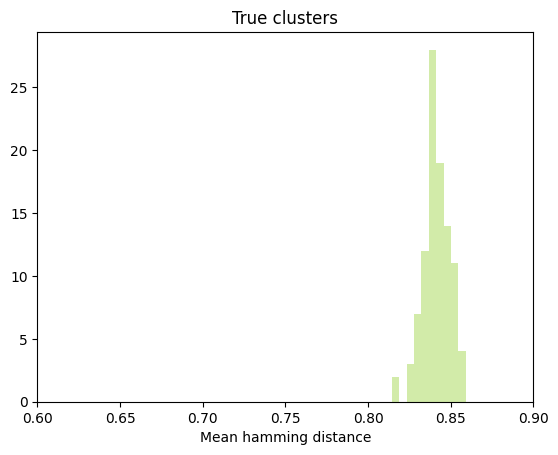

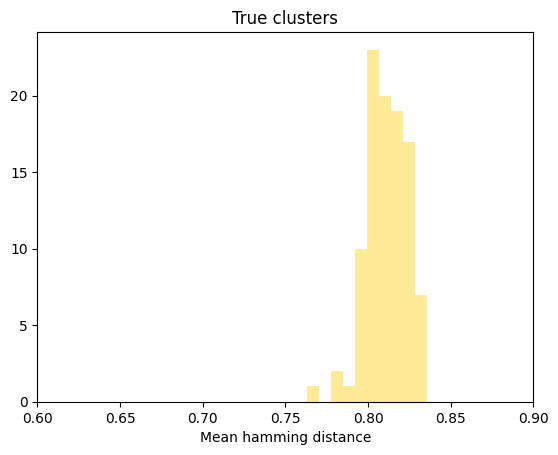

In [303]:
palette = sns.color_palette("Set2", 70, as_cmap=False)
# palette = sns.color_palette("Blues", 5, as_cmap=False)

# for t, type in enumerate(['0.0', '0.0625', '0.125', '0.25', '1.0']):
# for t, type in enumerate([0, 1, 2, 3, 4, 5]):
for t, type in enumerate(distances_df['type'].unique()):

    plt.hist(distances_df.loc[distances_df['type']==type, 'pseudo_dist_mean'], 
             color=palette[t], alpha=0.5, bins=10, label=type)
    plt.xlim([0.6, 0.9])
    # plt.legend()
    plt.xlabel('Mean hamming distance')
    plt.title('True clusters')
    plt.show()

Text(0.5, 0, 'Mean hamming distance')

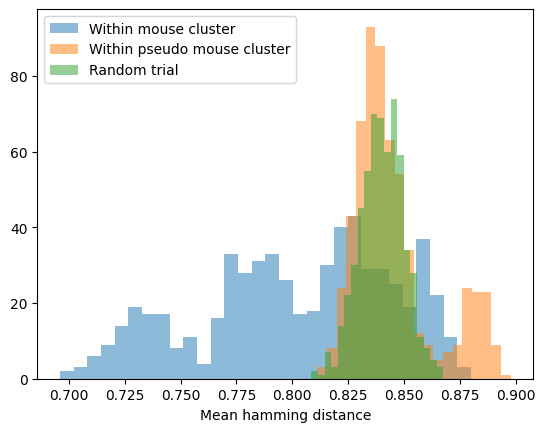

In [65]:
plt.hist(distances_df['ham_dist_mean'], alpha=0.5, bins=30, label='Within mouse cluster')
plt.hist(distances_df['pseudo_dist_mean'], alpha=.5, bins=20, label='Within pseudo mouse cluster')
plt.hist(distances_df['shuffle_mean'], alpha=.5, bins=20, label='Random trial')
plt.legend()
plt.xlabel('Mean hamming distance')
# plt.ylabel()


Text(0.5, 0, 'Mean hamming distance')

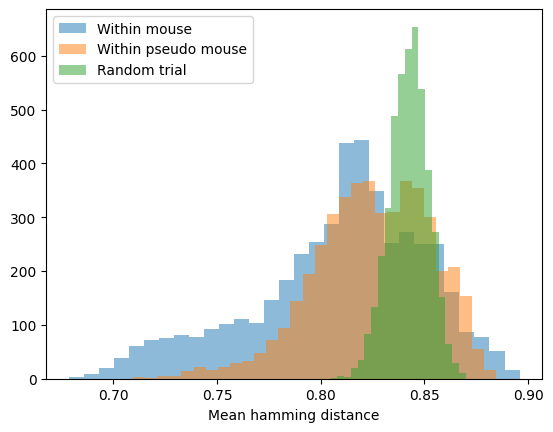

In [247]:
plt.hist(distances_df['ham_dist_mean'], alpha=0.5, bins=30, label='Within mouse')
plt.hist(distances_df['pseudo_dist_mean'], alpha=.5, bins=30, label='Within pseudo mouse')
plt.hist(distances_df['shuffle_mean'], alpha=.5, bins=20, label='Random trial')
plt.legend()
plt.xlabel('Mean hamming distance')
# plt.ylabel()

Text(0.5, 0, 'Mean hamming distance')

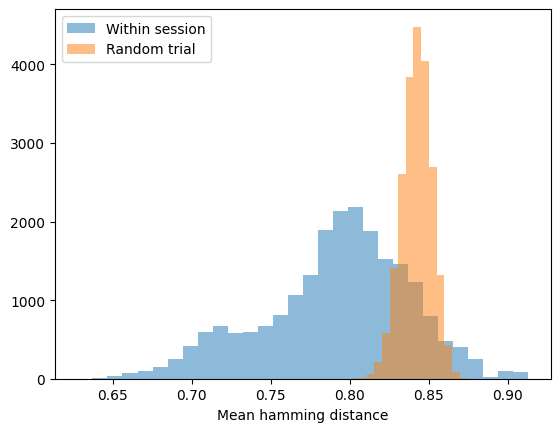

In [263]:
plt.hist(distances_df['ham_dist_mean'], alpha=0.5, bins=30, label='Within session')
# plt.hist(distances_df['pseudo_dist_mean'], alpha=.5, bins=20, label='Within pseudo trial mode')
plt.hist(distances_df['shuffle_mean'], alpha=.5, bins=15, label='Random trial')
plt.legend()
plt.xlabel('Mean hamming distance')
# plt.ylabel()

Text(0.5, 0, 'Mean hamming distance')

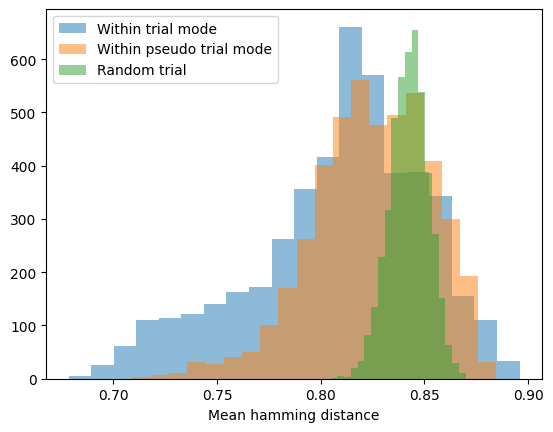

In [250]:
plt.hist(distances_df['ham_dist_mean'], alpha=0.5, bins=20, label='Within trial mode')
plt.hist(distances_df['pseudo_dist_mean'], alpha=.5, bins=20, label='Within pseudo trial mode')
plt.hist(distances_df['shuffle_mean'], alpha=.5, bins=20, label='Random trial')
plt.legend()
plt.xlabel('Mean hamming distance')

# plt.ylabel()


# Distances

In [27]:
from sklearn.metrics import pairwise_distances
from tqdm import trange

# PARAMETERS
N_TRIALS_PER_GROUP = 100   # balanced subsampling size
N_REPEATS = 30             # number of repetitions
N_PERM = 1           # permutation controls
METRIC = 'hamming'         # or 'euclidean', 'correlation', etc.

# DATA
# df must have:
# - df['feature_vector'] -> array-like vectors
# - df[level] -> group label for the clustering hierarchy

df = complete_df.copy()


def balanced_sample_vectors(df, level, n_trials):
    """Return feature matrix X and labels y for balanced subsample."""
    Xs, ys = [], []
    for group, gdf in df.groupby(level):
        if len(gdf) >= n_trials:
            sampled = gdf.sample(n_trials, replace=False)

            Xs.append(np.vstack(sampled['feature_vector'].values))
            ys.extend([group] * n_trials)
    if not Xs:  # no groups large enough
        return None, None
    return np.vstack(Xs), np.array(ys)

def compute_within_across(D, labels):
    labels = np.array(labels)
    n = len(labels)
    w, a = [], []
    for i in range(n):
        for j in range(i+1, n):
            if labels[i] == labels[j]:
                w.append(D[i,j])
            else:
                a.append(D[i,j])
    return np.mean(w), np.mean(a)

def run_level(df, level, n_trials, n_repeats):
    within, across = [], []
    for _ in trange(n_repeats, desc=f"Level {level}"):
        X, labels = balanced_sample_vectors(df, level, n_trials)
        if X is None:
            continue
        D = pairwise_distances(X, metric=METRIC)
        w, a = compute_within_across(D, labels)
        within.append(w); across.append(a)
    return np.mean(within), np.mean(across), np.std(within), np.std(across)

def permutation_control(df, level, n_trials, n_repeats, n_perm):
    null_w, null_a = [], []
    labels = df[level].values
    for _ in trange(n_perm, desc=f"Perm {level}"):
        perm_df = df.copy()
        perm_df[level] = np.random.permutation(labels)
        mw, ma, _, _ = run_level(perm_df, level, n_trials, n_repeats)
        null_w.append(mw); null_a.append(ma)
    return np.mean(null_w), np.mean(null_a), np.std(null_w), np.std(null_a)

# HIERARCHY LEVELS
levels = ['trial_type', 'trial_cluster', 'session', 'session_cluster', 'mouse_name', 'mouse_cluster']
levels = [ 'trial_cluster', 'session_cluster', 'mouse_cluster']
levels = ['trial_type', 'trial_cluster']
# levels = ['session', 'session_cluster', 'mouse_name', 'mouse_cluster']
results = []

for level in levels:
    mw, ma, sdw, sda = run_level(df, level, N_TRIALS_PER_GROUP, N_REPEATS)
    # nmw, nma, nsdw, nsda = permutation_control(df, level, 
    #                                            N_TRIALS_PER_GROUP,
    #                                            N_REPEATS,
    #                                            N_PERM)
    results.append({
        'level': level,
        'mean_within': mw, 'mean_across': ma,
        'std_within': sdw, 'std_across': sda,
    }) #         'null_within': nmw, 'null_across': nma


res_df = pd.DataFrame(results)
print(res_df)


Level trial_type:  67%|██████▋   | 20/30 [07:32<03:46, 22.63s/it]


KeyboardInterrupt: 

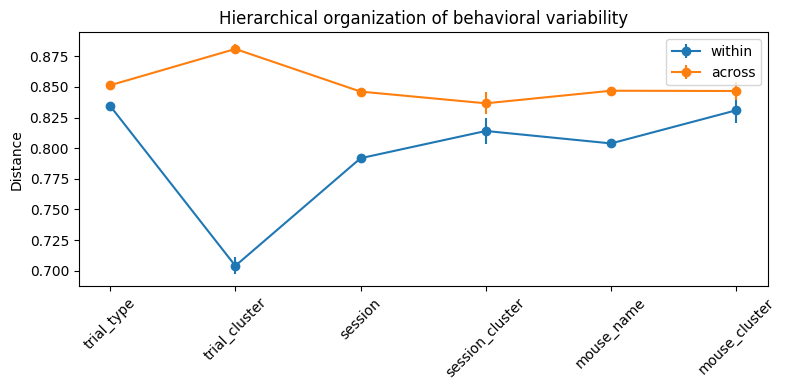

In [18]:
fig, ax = plt.subplots(figsize=(8,4))
x = np.arange(len(res_df))

ax.errorbar(x, res_df['mean_within'], yerr=res_df['std_within'], fmt='o-', label='within')
ax.errorbar(x, res_df['mean_across'], yerr=res_df['std_across'], fmt='o-', label='across')

ax.set_xticks(x)
ax.set_xticklabels(res_df['level'], rotation=45)
ax.set_ylabel("Distance")
ax.set_title("Hierarchical organization of behavioral variability")
ax.legend()
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import pairwise_distances

# PARAMETERS
N_TRIALS_PER_GROUP = 30   # how many trials to sample per group
N_REPEATS = 25            # how many subsampling repetitions
N_PERM = 50               # permutation controls

# -------------------------------------
# Pairwise distances ONCE for full data
# -------------------------------------
# X = np.stack(df['feature_vector'].values)

epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']
sequences_choice = np.vstack(complete_df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
X = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]

num_samples = 200

indices = np.random.choice(X.shape[0], num_samples, replace=False)  # Random indices
subsampled_matrix = complete_df[indices]
# D = pairwise_distances(X, metric='cosine')

# -------------------------------------
# Helper functions
# -------------------------------------
def balanced_sample_indices(labels, n_per_group):
    """Return indices for equal sampling per label."""
    unique = np.unique(labels)
    idx = []
    for u in unique:
        group_idx = np.where(labels == u)[0]
        if len(group_idx) < n_per_group:
            continue  # skip small groups
        idx.extend(np.random.choice(group_idx, n_per_group, replace=False))
    return np.array(idx)

def within_across(D, labels):
    labels = np.array(labels)
    n = len(labels)
    w, a = [], []
    for i in range(n):
        for j in range(i+1, n):
            if labels[i] == labels[j]:
                w.append(D[i, j])
            else:
                a.append(D[i, j])
    return np.mean(w), np.mean(a)

def subsampled_within_across(D, labels, n_per_group, n_repeats):
    wins, acs = [], []
    for _ in range(n_repeats):
        idx = balanced_sample_indices(labels, n_per_group)
        if len(idx) < 2 * n_per_group:  # require ≥2 groups
            continue
        w, a = within_across(D[np.ix_(idx, idx)], labels[idx])
        wins.append(w)
        acs.append(a)
    return np.mean(wins), np.mean(acs), np.std(wins), np.std(acs)

def permutation_control(D, labels, n_per_group, n_repeats, n_perm):
    null_w, null_a = [], []
    labels = np.array(labels)
    for _ in range(n_perm):
        perm = np.random.permutation(labels)
        mw, ma, _, _ = subsampled_within_across(D, perm, n_per_group, n_repeats)
        null_w.append(mw)
        null_a.append(ma)
    return np.mean(null_w), np.mean(null_a), np.std(null_w), np.std(null_a)

# -------------------------------------
# Apply to all hierarchical levels
# -------------------------------------
levels = ['trial_type', 'session_id', 'mouse_id', 'mouse_cluster']
results = []

for level in levels:
    labels = df[level].values

    mw, ma, sdw, sda = subsampled_within_across(D, labels, 
                                                N_TRIALS_PER_GROUP, 
                                                N_REPEATS)
    nmw, nma, nsdw, nsda = permutation_control(D, labels, 
                                               N_TRIALS_PER_GROUP, 
                                               N_REPEATS, 
                                               N_PERM)

    results.append({
        'level': level,
        'mean_within': mw,
        'mean_across': ma,
        'std_within': sdw,
        'std_across': sda,
        'null_within': nmw,
        'null_across': nma,
        'null_std_within': nsdw,
        'null_std_across': nsda
    })

res_df = pd.DataFrame(results)

# -------------------------------------
# Plot results side-by-side
# -------------------------------------
fig, axes = plt.subplots(1, len(levels), figsize=(4 * len(levels), 4), sharey=True)
for i, level in enumerate(levels):
    row = res_df.iloc[i]
    axes[i].bar(['within', 'across'], [row['mean_within'], row['mean_across']],
                yerr=[row['std_within'], row['std_across']],
                alpha=0.8)
    axes[i].set_title(level)
    axes[i].set_ylabel("Distance")
plt.suptitle("Balanced within–across distances across hierarchy levels")
plt.tight_layout()
plt.show()


In [ ]:
def expand_from_trial_type(df):
    
    df['feedback'] = df['trial_type'].str.split().str[:1].str.join('')
    df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
    df['block'] = df['trial_type'].str.split().str[2:3].str.join('')
    df['contrast'] = df['trial_type'].str.split().str[1:2].str.join('')
    df['side'] = df['choice'].copy()
    df.loc[(df['feedback']=='correct') & (df['choice']=='right'), 'side'] = 'left'
    df.loc[(df['feedback']=='correct') & (df['choice']=='left'), 'side'] = 'right'
    df['session'] = df['sample'].str.split().str[:1].str.join('')
    df['trial_id'] = df['sample'].str.split().str[1:2].str.join('')
    df['contrast'] = df['contrast'].astype(float)
    df['block'] = df['block'].astype(float)
    df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
    df.loc[df['choice']=='left', 'choice'] = 0
    df.loc[df['choice']=='right', 'choice'] = 1
    df.loc[df['feedback']=='correct', 'feedback'] = 1
    df.loc[df['feedback']=='incorrect', 'feedback'] = 0
    
    return df

def group_by_var_interest(session_syllables, var_interest, use_states):

    session_syllables = session_syllables.groupby(['mouse_name', 'session', 'session_cluster', var_interest])[np.arange(0, np.shape(final_matrix)[1], 1)].mean().reset_index()
    
    timesteps = 40
    reshaped_probs = pd.DataFrame()
    clusters = session_syllables['session_cluster'].copy()
    v_int = session_syllables[var_interest].copy()

    for i, interest in enumerate(np.unique(v_int)):
        for c, cluster in enumerate(np.unique(clusters)):
            reshaped_probs_cluster = pd.DataFrame(columns=['syllable', 'timestep', 'cluster', 'prob', var_interest], index=range(use_states * timesteps))
            indices = np.where((session_syllables['session_cluster']==cluster) & (session_syllables[var_interest]==interest))[0]
            syllable_prob = np.array(session_syllables[session_syllables.keys()[4:]])[indices, :].mean(axis=0)

            for t in range(timesteps):
                reshaped_probs_cluster['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '400', '500', '600', '700', '010', '110',
                            '210', '310', '410', '510', '610', '710', '001', '101', '201', '301', '401', '501', '601', '701', '011',
                            '111', '211', '311', '411', '511',  '611',  '711']
                reshaped_probs_cluster['timestep'][t*use_states:(t+1)*use_states] = t
                reshaped_probs_cluster['prob'][t*use_states:(t+1)*use_states] = syllable_prob[t*use_states:(t+1)*use_states]
                reshaped_probs_cluster['cluster'][t*use_states:(t+1)*use_states] = cluster
                reshaped_probs_cluster[var_interest][t*use_states:(t+1)*use_states] = interest
            # Save
            reshaped_probs = pd.concat([reshaped_probs, reshaped_probs_cluster])
            
    return reshaped_probs

def group_by_cluster(session_syllables, use_states):

    session_syllables = session_syllables.groupby(['mouse_name', 'session', 'session_cluster'])[np.arange(0, np.shape(final_matrix)[1], 1)].mean().reset_index()
    
    timesteps = 40
    reshaped_probs = pd.DataFrame()
    clusters = session_syllables['session_cluster'].copy()

    for c, cluster in enumerate(np.unique(clusters)):
        reshaped_probs_cluster = pd.DataFrame(columns=['syllable', 'timestep', 'cluster', 'prob'], index=range(use_states * timesteps))
        indices = np.where((session_syllables['session_cluster']==cluster))[0]
        syllable_prob = np.array(session_syllables[session_syllables.keys()[3:]])[indices, :].mean(axis=0)

        for t in range(timesteps):
            reshaped_probs_cluster['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '400', '500', '600', '700', '010', '110',
                        '210', '310', '410', '510', '610', '710', '001', '101', '201', '301', '401', '501', '601', '701', '011',
                        '111', '211', '311', '411', '511',  '611',  '711']
            reshaped_probs_cluster['timestep'][t*use_states:(t+1)*use_states] = t
            reshaped_probs_cluster['prob'][t*use_states:(t+1)*use_states] = syllable_prob[t*use_states:(t+1)*use_states]
            reshaped_probs_cluster['cluster'][t*use_states:(t+1)*use_states] = cluster
        # Save
        reshaped_probs = pd.concat([reshaped_probs, reshaped_probs_cluster])
            
    return reshaped_probs

In [ ]:
complete_df = expand_from_trial_type(all_sequences)


In [ ]:
complete_df = expand_from_trial_type(all_sequences)
complete_df = complete_df.merge(cluster_df[['mouse_name', 'session', 'session_cluster']], on=['mouse_name', 'session'])
# complete_df = complete_df.merge(trial_clusters_df[['mouse_name', 'session', 'trial_id', 'trial_cluster']], on=['mouse_name', 'session', 'trial_id'])

# Hamming distances

## Per epoch and cluster

In [ ]:
# hamming_df = complete_df.merge(cluster_df[['mouse_name', 'session', 'session_cluster']], on=['mouse_name', 'session'])
hamming_df = complete_df.copy()

hamming_df['type'] = hamming_df['trial_type'].str.split().str[:2].str.join('')
# all_sequences['type'] = all_sequences['trial_type'].copy()
hamming_df['y'] = hamming_df['broader_label'] + hamming_df['session_cluster'].astype(str)
hamming_df['y'] = hamming_df['broader_label'] + hamming_df['session'].astype(str)
hamming_df['y'] = hamming_df['broader_label'] + hamming_df['mouse_name'].astype(str)
# hamming_df['y'] = hamming_df['session']
hamming_df['session_cluster'] = hamming_df['session_cluster'].astype(str) 

sequence_types = hamming_df['y'].unique()
len_matrix = 19900  # 4950
num_samples = 200

all_cos_sim = pd.DataFrame(columns=['mouse_name', 'epoch', 'session_cluster', 'session', 'cos_sim', 'shuffle'], index=range(len(sequence_types)*len_matrix))
for s, stype in enumerate(sequence_types):
    use_data = hamming_df.loc[hamming_df['y']==stype]
    
    # Shuffle cluster within same epoch
    epoch = list(use_data.loc[use_data['y']==stype, 'broader_label'])[0]
    # Any mouse
    shuffle_data = hamming_df.loc[hamming_df['broader_label']==list(use_data.loc[use_data['y']==stype, 'broader_label'])[0]]  # hamming_df.copy()
    # shuffle_data = hamming_df.copy()
    
    X = np.vstack(use_data['binned_sequence'].apply(lambda x: np.array(x)).values)
    X_final = X[~np.isnan(X).any(axis=1), :].astype(int)

    X_shuffle = np.vstack(shuffle_data['binned_sequence'].apply(lambda x: np.array(x)).values)
    X_final_shuffle = X_shuffle[~np.isnan(X_shuffle).any(axis=1), :].astype(int)
    
    if len(X_final) > num_samples:
        
        # Downsample
        indices = np.random.choice(X_final.shape[0], num_samples, replace=False)  # Random indices
        subsampled_matrix = X_final[indices]
        indices_shuffle = np.random.choice(X_final_shuffle.shape[0], num_samples, replace=False)  # Random indices
        subsampled_matrix_shuffle = X_final_shuffle[indices_shuffle]

        # cos_sim_matrix = cosine_similarity(subsampled_matrix.astype(np.uint8))
        # cos_sim_matrix_shuffle = cosine_similarity(subsampled_matrix_shuffle.astype(np.uint8))
        cos_sim_matrix = distance.pdist(subsampled_matrix.astype(np.uint8), metric='hamming')
        cos_sim_matrix_shuffle = distance.pdist(subsampled_matrix_shuffle.astype(np.uint8), metric='hamming')
        
        # Save results
        all_cos_sim['mouse_name'][s*len_matrix:(s+1)*len_matrix] = list(use_data.loc[use_data['y']==stype, 'mouse_name'])[0]
        all_cos_sim['epoch'][s*len_matrix:(s+1)*len_matrix] = list(use_data.loc[use_data['y']==stype, 'broader_label'])[0]
        all_cos_sim['session_cluster'][s*len_matrix:(s+1)*len_matrix] = list(use_data.loc[use_data['y']==stype, 'session_cluster'])[0]
        all_cos_sim['session'][s*len_matrix:(s+1)*len_matrix] = list(use_data.loc[use_data['y']==stype, 'session'])[0]
        all_cos_sim['cos_sim'][s*len_matrix:(s+1)*len_matrix] = cos_sim_matrix
        all_cos_sim['shuffle'][s*len_matrix:(s+1)*len_matrix] = cos_sim_matrix_shuffle

        # del use_data, X, X_final, X_shuffle, X_final_shuffle, subsampled_matrix,  subsampled_matrix_shuffle, cos_sim_matrix, cos_sim_matrix_shuffle
all_cos_sim['diff'] = all_cos_sim['shuffle'] - all_cos_sim['cos_sim']


/tmp/ipykernel_34842/3260123522.py:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  all_cos_sim['mouse_name'][s*len_matrix:(s+1)*len_matrix] = list(use_data.loc[use_data['y']==stype, 'mouse_name'])[0]
/tmp/ipykernel_34842/3260123522.py:47: 

In [25]:
data_path = prefix + 'representation_learning_variability/DATA/'
# data_path =  '/Users/ineslaranjeira/Documents/Repositories/representation_learning_variability/DATA/'
learning_df = pd.read_csv(data_path+'learning_private_one.csv')
learning_times = learning_df[['subject_nickname', 'training_time']].drop_duplicates()
learning_times = learning_times.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

data_path =  prefix + 'representation_learning_variability/DATA/'
learning_df = pd.read_parquet(data_path+'training_time_03-21-2025', engine='pyarrow')
learning_times_new = learning_df.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

# new_df = design_df.droplevel(1, axis=1)[['mouse_name', 'session']]
# df = new_df.merge(learning_times, on='mouse_name')
a = learning_times.merge(learning_times_new, on='mouse_name', how='outer')
b = a.loc[a['training_time_x'].isna()]
b = b.rename(columns={"training_time_y": "training_time"}).reset_index()

full_learning = pd.concat([learning_times[['mouse_name', 'training_time']], b[['mouse_name', 'training_time']]]).reset_index()

/tmp/ipykernel_34842/1096352341.py:3: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  learning_df = pd.read_csv(data_path+'learning_private_one.csv')


## Decoding accuracy and learning time

In [20]:
data_path =  prefix + 'representation_learning_variability/paper-individuality/fig4_clustering/'
diagonal = pd.read_parquet(data_path+'mouse_decoding_accuracy', engine='pyarrow')
diagonal = diagonal.rename(columns={'mouse_number':'mouse_name'})
merged_accuracy = diagonal.merge(full_learning, on=['mouse_name'])

Text(0.5, 0, 'Within session distance ')

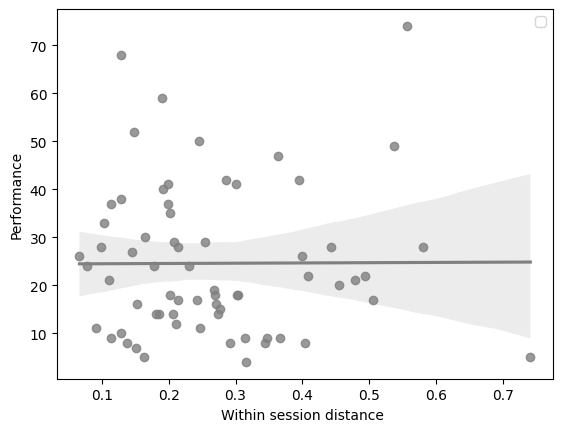

In [39]:
use_data = merged_accuracy.copy() #.loc[distances_df['variable']=='cos_sim']
sns.regplot(x=np.array(use_data['accuracy']).astype(float), y=use_data['training_time'].astype(float), ci=95, color='grey') 

plt.legend('')
plt.ylabel('Performance') 
plt.xlabel('Within session distance ')

## Cluster entropy and learning time

In [26]:
merged_entropy = cluster_ent.merge(full_learning, on=['mouse_name'])

In [27]:
mouse_ent = merged_entropy.loc[merged_entropy['Shuffled']>0].groupby(['mouse_name', 'training_time', 'session_len'])['norm_dif'].mean().reset_index()
mouse_ent.rename(columns={'session_len':'Session count'})

,mouse_name,training_time,Session count,norm_dif
0,CSH_ZAD_019,50.0,4,0.044225
1,CSH_ZAD_026,18.0,6,0.714897
2,CSH_ZAD_029,22.0,5,0.960480
3,DY_016,8.0,5,1.000000
4,DY_018,17.0,3,1.000000
5,DY_020,24.0,8,0.310395
6,NR_0019,52.0,3,0.755610
7,NR_0020,29.0,4,0.997060
8,NR_0021,37.0,3,0.146903
9,NYU-30,14.0,3,0.962950


In [23]:
mouse_ent['Session count'] = mouse_ent['session_len']

In [41]:
low_ent_mice = mouse_ent.loc[mouse_ent['norm_dif']> 0.4, 'mouse_name']

In [43]:
np.save('low_ent_mice', low_ent_mice)

/tmp/ipykernel_11904/3353458.py:4: UserWarning: The palette list has more values (10) than needed (9), which may not be intended.
  sns.scatterplot(x='norm_dif', y='training_time', hue='Session count', palette=palette, data=mouse_ent)


PearsonRResult(statistic=np.float64(-0.4476482439275803), pvalue=np.float64(0.0029531850425031504))

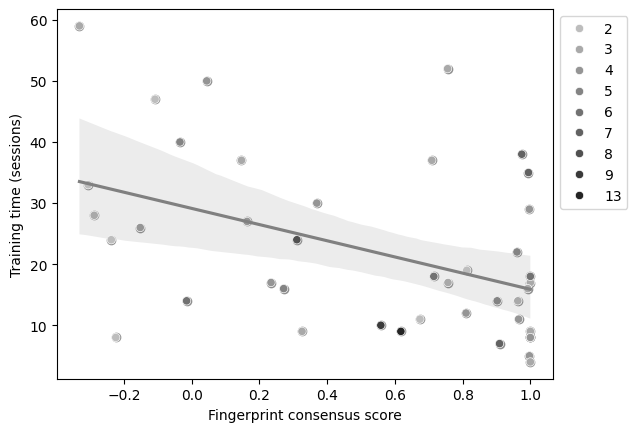

In [27]:
palette = sns.color_palette('Greys',epochs 15)[5:]
# use_data = mouse_entmouse_ent.rename(columns={'Session count'})
sns.regplot(x=np.array(mouse_ent['norm_dif']).astype(float), y=mouse_ent['training_time'].astype(float), ci=95, color='grey') 
sns.scatterplot(x='norm_dif', y='training_time', hue='Session count', palette=palette, data=mouse_ent) 

# plt.legend('')
plt.ylabel('Training time (sessions)') 
plt.xlabel('Fingerprint consensus score')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

from scipy import stats
x = np.array(mouse_ent['norm_dif']).astype(float)
y = np.array(mouse_ent['training_time']).astype(float)
res = stats.pearsonr(x, y)
res

In [14]:
within_mice = pd.DataFrame(all_cos_sim.groupby(['mouse_name', 'session', 'session_cluster'])['cos_sim'].mean()).reset_index()
across_mice = pd.DataFrame(all_cos_sim.groupby(['mouse_name', 'session', 'session_cluster'])['shuffle'].mean()).reset_index()
distances_df = within_mice.merge(across_mice, on=['mouse_name', 'session', 'session_cluster'])
distances_df = pd.melt(distances_df, id_vars=['session_cluster', 'session', 'mouse_name'], value_vars=['cos_sim', 'shuffle'])
performance_df = pd.DataFrame(complete_df.groupby(['session', 'mouse_name'])['feedback'].mean()).reset_index()
distances_df = distances_df.merge(performance_df, on=['mouse_name', 'session'])
distances_df = distances_df.merge(full_learning, on=['mouse_name'])


NameError: name 'full_learning' is not defined

In [54]:
within_mice = pd.DataFrame(all_cos_sim.groupby(['mouse_name'])['cos_sim'].mean()).reset_index()
across_mice = pd.DataFrame(all_cos_sim.groupby(['mouse_name'])['shuffle'].mean()).reset_index()
distances_df = within_mice.merge(across_mice, on=['mouse_name'])
distances_df = pd.melt(distances_df, id_vars=['mouse_name'], value_vars=['cos_sim', 'shuffle'])
distances_df = distances_df.merge(full_learning, on=['mouse_name'])


PearsonRResult(statistic=np.float64(-0.07579692389545695), pvalue=np.float64(0.2788842274520604))

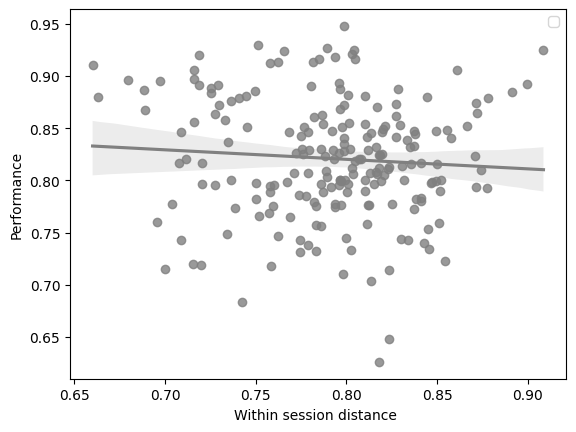

In [58]:
use_data = distances_df.loc[distances_df['variable']=='cos_sim']
sns.regplot(x=np.array(use_data['value']).astype(float), y=use_data['feedback'].astype(float), ci=95, color='grey') 

plt.legend('')
plt.ylabel('Performance') 
plt.xlabel('Within session distance ')

from scipy import stats
x = np.array(distances_df.loc[distances_df['variable']=='cos_sim', 'value']).astype(float)
y = np.array(distances_df.loc[distances_df['variable']=='cos_sim', 'feedback']).astype(float)
res = stats.pearsonr(x, y)
res

/tmp/ipykernel_10464/1452026220.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  use_data['log_training_time'] = np.log(use_data['training_time'])


PearsonRResult(statistic=np.float64(0.1458203921051649), pvalue=np.float64(0.036494655040920546))

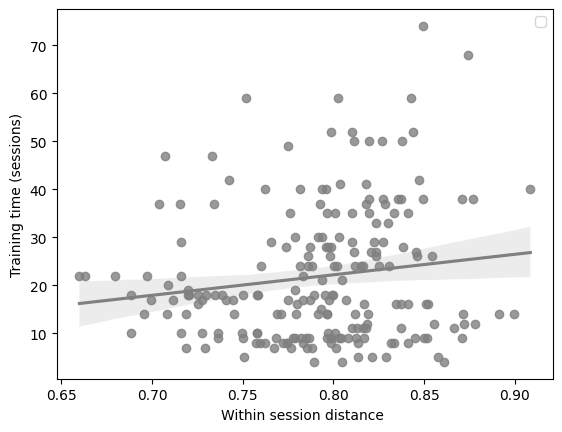

In [48]:
use_data = distances_df.loc[distances_df['variable']=='cos_sim']
use_data['log_training_time'] = np.log(use_data['training_time'])
sns.regplot(x=np.array(use_data['value']).astype(float), y=use_data['training_time'].astype(float), ci=95, color='grey') 
# sns.scatterplot(x='value', y='log_training_time',  hue='mouse_name', data=distances_df.loc[distances_df['variable']=='cos_sim'])  #  hue='variable',

plt.legend('')
plt.ylabel('Training time (sessions)') 
plt.xlabel('Within session distance ')

from scipy import stats
x = np.array(distances_df.loc[distances_df['variable']=='cos_sim', 'value']).astype(float)
y = np.array(distances_df.loc[distances_df['variable']=='cos_sim', 'training_time']).astype(float)
res = stats.pearsonr(x, y)
res

Text(0.5, 0, 'Average trial hamming distance')

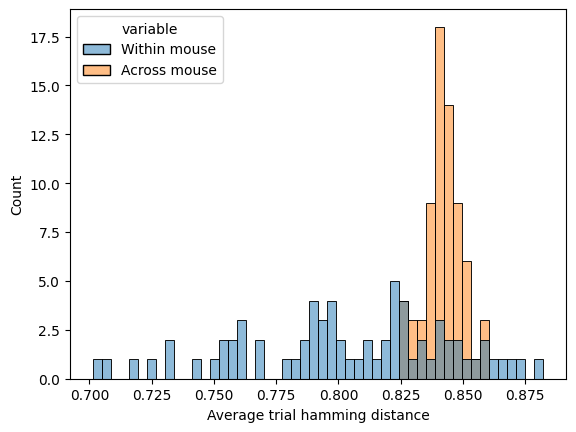

In [141]:
within_mice = pd.DataFrame(all_cos_sim.groupby(['mouse_name'])['cos_sim'].mean()).reset_index()
across_mice = pd.DataFrame(all_cos_sim.groupby(['mouse_name'])['shuffle'].mean()).reset_index()
distances_df = within_mice.merge(across_mice, on=['mouse_name'])
distances_df = pd.melt(distances_df, id_vars=['mouse_name'], value_vars=['cos_sim', 'shuffle'])

distances_df.loc[distances_df['variable']=='cos_sim', 'variable'] = 'Within mouse'
distances_df.loc[distances_df['variable']=='shuffle', 'variable'] = 'Across mouse'
sns.histplot(x='value', hue='variable', data=distances_df, bins=50)
plt.xlabel('Average trial hamming distance')


In [171]:
threshold = np.mean(distances_df.loc[(distances_df['variable']=='Across mouse'), 'value']) - 1*np.std(distances_df.loc[(distances_df['variable']=='Across mouse'), 'value'])

In [172]:
low_stereo_mice = distances_df.loc[(distances_df['variable']=='Within mouse') & (distances_df['value']>=threshold)]
high_stereo_mice = distances_df.loc[(distances_df['variable']=='Within mouse') & (distances_df['value']<threshold)]

In [176]:
high_stereo_mice.to_parquet('high_stereo_mice')

(0.7, 1.0)

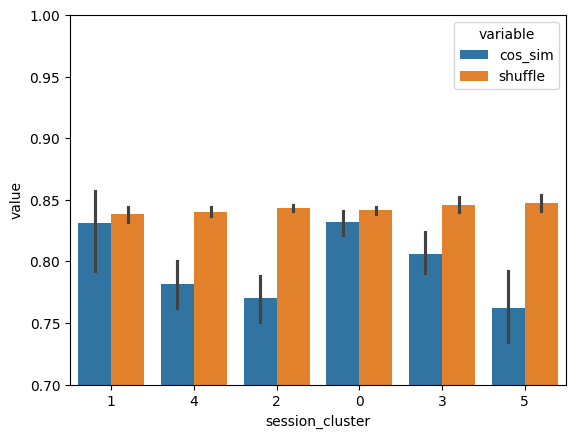

In [145]:
within_mice = pd.DataFrame(all_cos_sim.groupby(['mouse_name', 'session_cluster'])['cos_sim'].mean()).reset_index()
across_mice = pd.DataFrame(all_cos_sim.groupby(['mouse_name', 'session_cluster'])['shuffle'].mean()).reset_index()
distances_df = within_mice.merge(across_mice, on=['mouse_name', 'session_cluster'])
distances_df = pd.melt(distances_df, id_vars=['mouse_name', 'session_cluster'], value_vars=['cos_sim', 'shuffle'])

sns.barplot(x='session_cluster', hue='variable', y='value', data=distances_df)
plt.ylim([0.7, 1])


Text(0, 0.5, 'Distance shuffle - distance fingerprint')

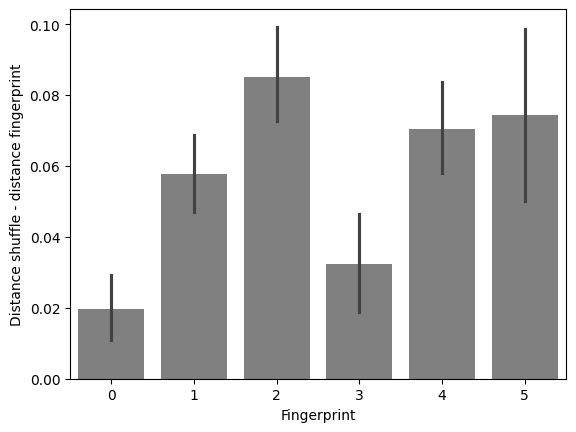

In [62]:
use_data = all_cos_sim.groupby(['mouse_name', 'session_cluster', 'session'])['diff'].mean().reset_index()
sns.barplot(y='diff', x='session_cluster', order=['0', '1', '2', '3', '4', '5'], data=use_data, color='Grey')
plt.xlabel('Fingerprint')
plt.ylabel('Distance shuffle - distance fingerprint')

/tmp/ipykernel_10239/390189680.py:8: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:grey'` for the same effect.

  sns.barplot(x='epoch', y='value', hue='Dataset', data=new_df, color='grey',


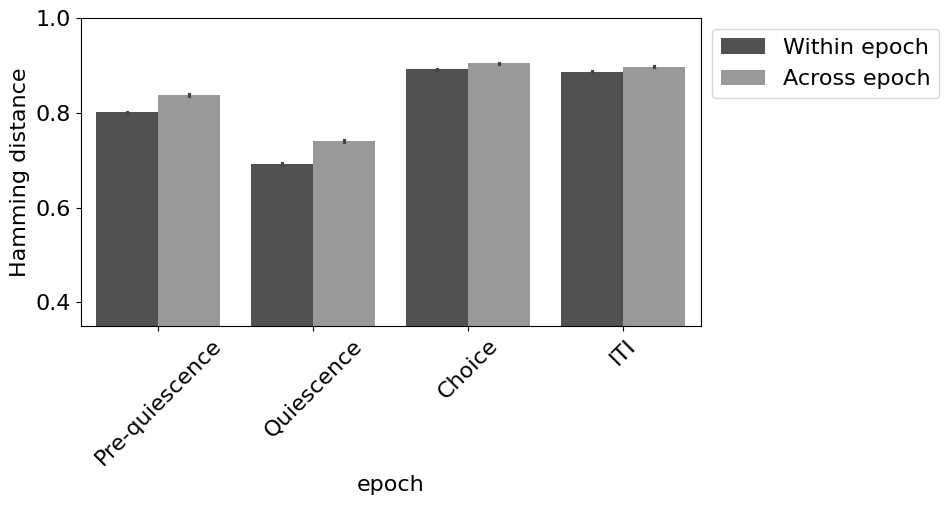

In [89]:
plt.rcParams.update({'font.size': 16})
new_df = pd.melt(all_cos_sim, id_vars=['session_cluster', 'epoch'], value_vars=['cos_sim', 'shuffle'])
new_df = new_df.rename(columns={"variable": "Dataset"})
new_df.loc[new_df['Dataset']=='cos_sim', 'Dataset'] = 'Within epoch'
new_df.loc[new_df['Dataset']=='shuffle', 'Dataset'] = 'Across epoch'

plt.figure(figsize=[8, 4])
sns.barplot(x='epoch', y='value', hue='Dataset', data=new_df, color='grey', 
            order=['Pre-quiescence', 'Quiescence', 'Choice', 'ITI'],  alpha=.8)
plt.xticks(rotation=45)
plt.ylim([.35, 1])
plt.ylabel('Hamming distance')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

/tmp/ipykernel_10239/965901516.py:6: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:grey'` for the same effect.

  sns.barplot(x='session_cluster', y='value', hue='epoch', data=new_df, color='grey',


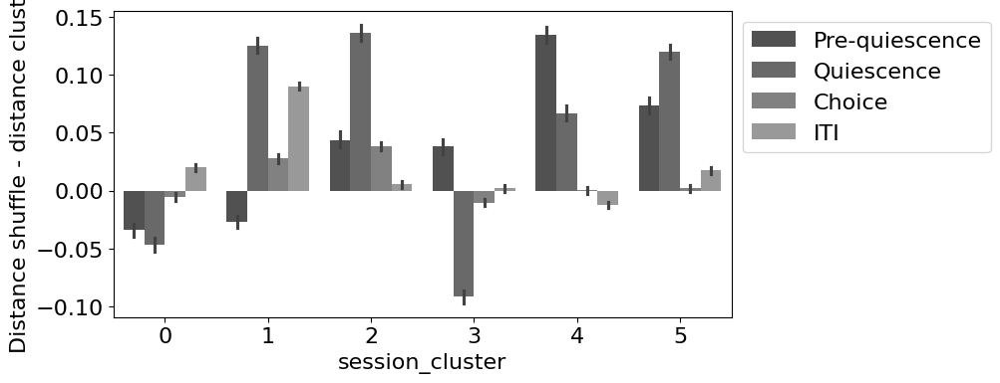

In [71]:
plt.rcParams.update({'font.size': 16})
new_df = pd.melt(all_cos_sim, id_vars=['session_cluster', 'epoch'], value_vars=['diff'])
new_df = new_df.rename(columns={"variable": "Dataset"})

plt.figure(figsize=[8, 4])
sns.barplot(x='session_cluster', y='value', hue='epoch', data=new_df, color='grey', 
            hue_order=['Pre-quiescence', 'Quiescence', 'Choice', 'ITI'], order=['0', '1', '2', '3', '4', '5'], alpha=.8)
# plt.xticks(rotation=45)
# plt.ylim([.35, 1])
plt.ylabel('Distance shuffle - distance cluster')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

/tmp/ipykernel_7580/707975972.py:8: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:grey'` for the same effect.

  sns.barplot(x='epoch', y='value', hue='session_cluster', data=new_df, color='grey',


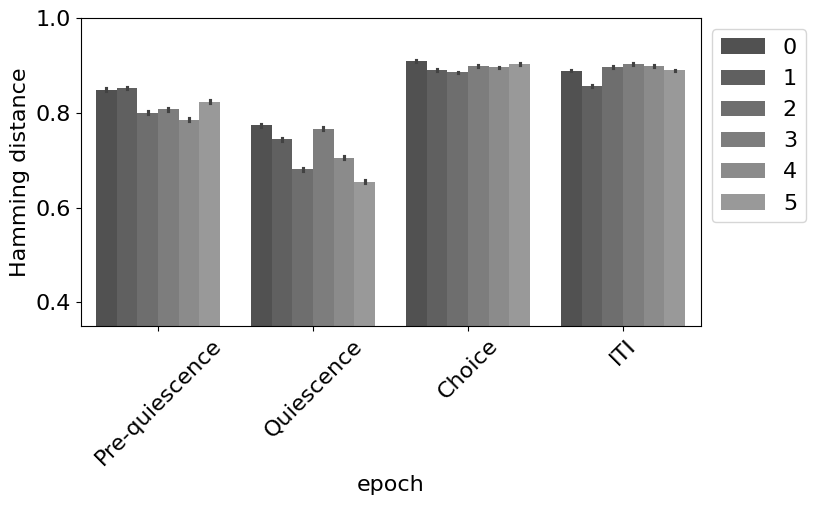

/tmp/ipykernel_7580/707975972.py:17: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:grey'` for the same effect.

  sns.barplot(x='session_cluster', y='value', hue='Dataset', data=new_df, color='grey',


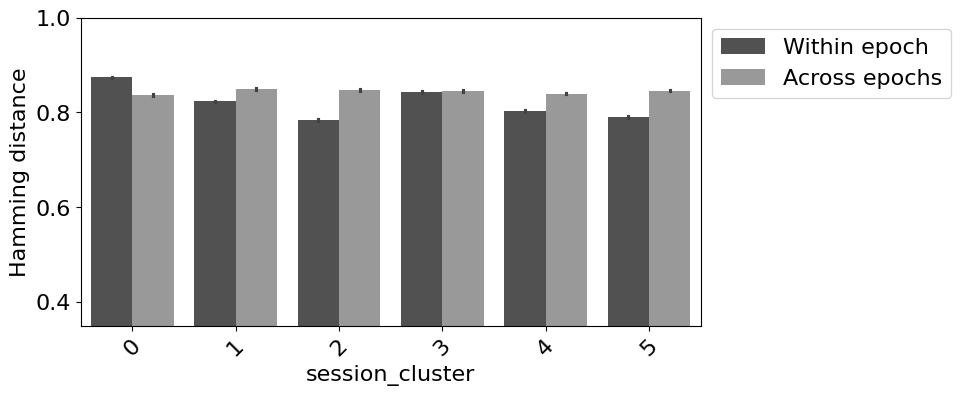

In [29]:

plt.rcParams.update({'font.size': 16})
new_df = pd.melt(all_cos_sim, id_vars=['session_cluster', 'epoch'], value_vars=['cos_sim', 'shuffle'])
new_df = new_df.rename(columns={"variable": "Dataset"})
new_df.loc[new_df['Dataset']=='cos_sim', 'Dataset'] = 'Within epoch'
new_df.loc[new_df['Dataset']=='shuffle', 'Dataset'] = 'Across epochs'

plt.figure(figsize=[8, 4])
sns.barplot(x='epoch', y='value', hue='session_cluster', data=new_df, color='grey', 
            order=['Pre-quiescence', 'Quiescence', 'Choice', 'ITI'], hue_order=['0', '1', '2', '3', '4', '5'], alpha=.8)
plt.xticks(rotation=45)
plt.ylim([.35, 1])
plt.ylabel('Hamming distance')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

plt.figure(figsize=[8, 4])
sns.barplot(x='session_cluster', y='value', hue='Dataset', data=new_df, color='grey', 
            order=['0', '1', '2', '3', '4', '5'], alpha=.8)
plt.xticks(rotation=45)
plt.ylim([.35, 1])
plt.ylabel('Hamming distance')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

## Per mouse

In [10]:
hamming_df = complete_df.copy()# hamming_df = complete_df.merge(cluster_df[['mouse_name', 'session', 'session_cluster']], on=['mouse_name', 'session'])
hamming_df['type'] = hamming_df['trial_type'].str.split().str[:2].str.join('')
# all_sequences['type'] = all_sequences['trial_type'].copy()
hamming_df['y'] = hamming_df['broader_label']  # hamming_df['session_cluster'].astype(str) + 

sequence_types = hamming_df['y'].unique()
unique_mice = hamming_df['mouse_name'].unique()
unique_sessions = hamming_df['session'].unique()

len_matrix = 19900  # 4950
num_samples = 200

# len_matrix = 4950
# num_samples = 100

cos_sim = pd.DataFrame(columns=['mouse_name', 'session', 'epoch', 'cos_sim', 'shuffle'])

for s, stype in enumerate(sequence_types):
    use_data = hamming_df.loc[hamming_df['y']==stype]
    mouse_cos_sim = pd.DataFrame(columns=['mouse_name', 'session', 'epoch', 'cos_sim', 
                                          'shuffle'], index=range(len(sequence_types)*len_matrix))
    
    for m, session in enumerate(unique_sessions):
        mouse_data = use_data.loc[use_data['session']==session]
        mouse_name = list(use_data.loc[use_data['session']==session, 'mouse_name'])[0]
        shuffle_mouse = hamming_df.loc[(hamming_df['y']==stype) & (hamming_df['mouse_name']==mouse_name)]
        # shuffle_mouse = use_data.copy()
        
        X = np.vstack(mouse_data['binned_sequence'].apply(lambda x: np.array(x)).values)
        X_final = X[~np.isnan(X).any(axis=1), :].astype(int)
        X_shuffle = np.vstack(shuffle_mouse['binned_sequence'].apply(lambda x: np.array(x)).values)
        X_shuffle_final = X_shuffle[~np.isnan(X_shuffle).any(axis=1), :].astype(int)
        
        if len(X_final) > num_samples:
            # Downsample
            indices = np.random.choice(X_final.shape[0], num_samples, replace=False)  # Random indices
            subsampled_matrix = X_final[indices]
            indices_shuffle = np.random.choice(X_shuffle_final.shape[0], num_samples, replace=False)  # Random indices
            subsampled_matrix_shuffle = X_shuffle_final[indices_shuffle]
                            
            cos_sim_matrix = distance.pdist(subsampled_matrix.astype(np.uint8), metric='hamming')
            cos_sim_matrix_shuffle = distance.pdist(subsampled_matrix_shuffle.astype(np.uint8), metric='hamming')
            
            # Save results
            mouse_cos_sim['epoch'][s*len_matrix:(s+1)*len_matrix] = stype 
            mouse_cos_sim['mouse_name'][s*len_matrix:(s+1)*len_matrix] = mouse_name
            mouse_cos_sim['session'][s*len_matrix:(s+1)*len_matrix] = session
            mouse_cos_sim['cos_sim'][s*len_matrix:(s+1)*len_matrix] = cos_sim_matrix
            mouse_cos_sim['shuffle'][s*len_matrix:(s+1)*len_matrix] = cos_sim_matrix_shuffle
            
            
            cos_sim = pd.concat([cos_sim, mouse_cos_sim], ignore_index=True)
                
        else:
            print(session)

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_29223/210383717.py:45: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  mouse_cos_sim['epoch'][s*len_matrix:(s+1)*len_matrix] = stype
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ip

In [19]:
a = pd.DataFrame(cos_sim.groupby(['mouse_name', 'session'])[['cos_sim', 'shuffle']].mean()).reset_index()

## Correlation distance within and across sessions for each animal

In [12]:
new_df = pd.melt(cos_sim, id_vars=['mouse_name', 'session'], value_vars=['cos_sim', 'shuffle'])
grouped_df = pd.DataFrame(new_df.groupby(['mouse_name', 'session', 'variable'])['value'].mean()).reset_index()

KeyboardInterrupt: 

In [13]:
sess_df = cos_sim[['mouse_name', 'session']].drop_duplicates()
sess_count = pd.DataFrame(sess_df.groupby(['mouse_name'])['session'].count().rename('count')).reset_index()
grouped_df = grouped_df.merge(sess_count, on=['mouse_name'])

In [14]:
pivot_session_df = grouped_df.pivot(index=['mouse_name', 'session', 'count'], columns=['variable'], values='value').reset_index().dropna()


Text(0, 0.5, 'Across session distance')

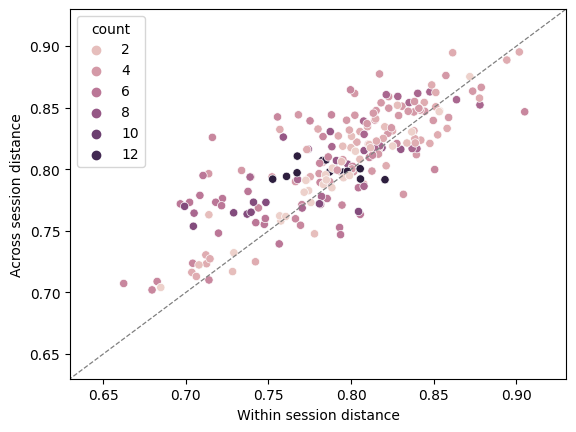

In [15]:
sns.scatterplot(x='cos_sim', y='shuffle', hue='count', data=pivot_session_df)
plt.xlim([0.63, 0.93])
plt.ylim([0.63, 0.93])
plt.plot(np.arange(0, 1, 0.01), np.arange(0, 1, 0.01), color='grey', linewidth=.9, linestyle='dashed')
plt.xlabel('Within session distance')
plt.ylabel('Across session distance')

## Correlation distance within and across sessions for each animal

In [56]:
new_df = pd.melt(cos_sim, id_vars=['mouse_name', 'session'], value_vars=['cos_sim', 'shuffle'])
grouped_df = pd.DataFrame(new_df.groupby(['mouse_name', 'variable'])['value'].mean()).reset_index()

: 

In [10]:
sess_df = cos_sim[['mouse_name', 'session']].drop_duplicates()
sess_count = pd.DataFrame(sess_df.groupby(['mouse_name'])['session'].count().rename('count')).reset_index()
grouped_df = grouped_df.merge(sess_count, on=['mouse_name'])

In [11]:
pivot_mouse_df = grouped_df.pivot(index=['mouse_name', 'count'], columns=['variable'], values='value').reset_index().dropna()

In [13]:
pivot_mouse_df = pivot_mouse_df.rename(columns={'count':'Session count'})


/tmp/ipykernel_11904/1349064272.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  orig_map=plt.cm.get_cmap('Greys', 20)


NameError: name 'stats' is not defined

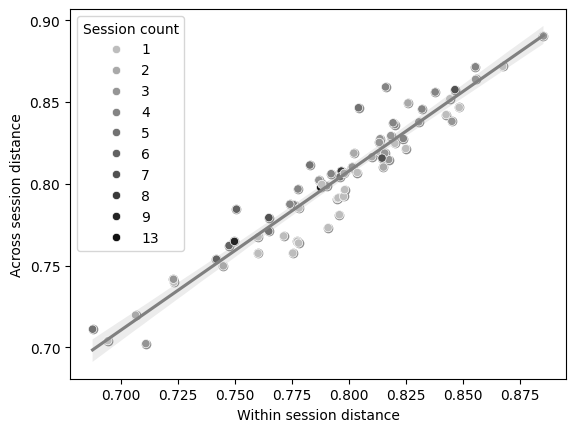

In [15]:
orig_map=plt.cm.get_cmap('Greys', 20)
# reversing the original colormap using reversed() function
reversed_map = orig_map.reversed()
palette = sns.color_palette('Greys', 15)[5:]
sns.regplot(x=np.array(pivot_mouse_df['cos_sim']).astype(float), y=pivot_mouse_df['shuffle'].astype(float), ci=95, color='grey') 
sns.scatterplot(x='cos_sim', y='shuffle', hue='Session count', palette=palette, data=pivot_mouse_df)

# plt.xlim([0.66, 0.92])
# plt.ylim([0.66, 0.92])
# plt.plot(np.arange(0, 1, 0.01), np.arange(0, 1, 0.01), color='grey', linewidth=.9, linestyle='dashed')
plt.xlabel('Within session distance')
plt.ylabel('Across session distance')

# data = pivot_mouse_df.dropna()
x = np.array(pivot_mouse_df['cos_sim']).astype(float)
y = np.array(pivot_mouse_df['shuffle']).astype(float)
res = stats.pearsonr(x, y)
print(res)

In [100]:
mouse_ent = cluster_ent.loc[cluster_ent['Shuffled']>0].groupby(['mouse_name', 'session_len'])['norm_dif'].mean().reset_index()
mouse_ent = pivot_mouse_df.merge(mouse_ent, on=['mouse_name'])


In [102]:
mouse_ent['thresholded'] = mouse_ent['norm_dif'].copy()
mouse_ent.loc[(mouse_ent['norm_dif']>.4), 'thresholded'] = 'Low entropy'
mouse_ent.loc[(mouse_ent['norm_dif']<=0.4), 'thresholded'] = 'High entropy'

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_44196/2141009394.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Low entropy' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  mouse_ent.loc[(mouse_ent['norm_dif']>.4), 'thresholded'] = 'Low entropy'


In [ ]:
orig_map=plt.cm.get_cmap('Greys', 20)
# reversing the original colormap using reversed() function
reversed_map = orig_map.reversed()
palette = sns.color_palette('Greys', 15)[5:]
sns.scatterplot(x='cos_sim', y='shuffle', hue='count', palette=palette, data=pivot_mouse_df)
plt.xlim([0.66, 0.92])
plt.ylim([0.66, 0.92])
plt.plot(np.arange(0, 1, 0.01), np.arange(0, 1, 0.01), color='grey', linewidth=.9, linestyle='dashed')
plt.xlabel('Within session distance')
plt.ylabel('Across session distance')

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has 

TtestResult(statistic=-1.2055645627365283, pvalue=0.23442882940705717, df=44.0)

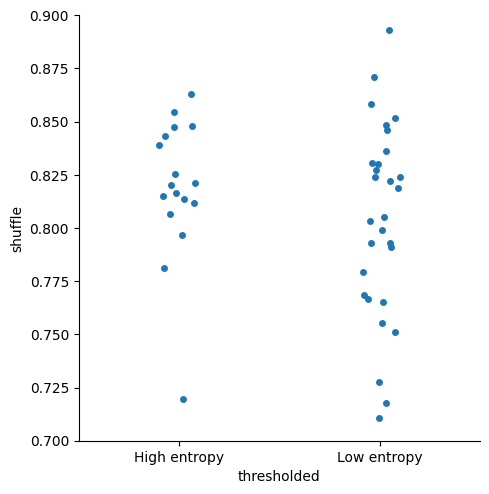

In [108]:
sns.catplot(x='thresholded', y='shuffle', data=mouse_ent)
plt.ylim([0.7, 0.9])
low = np.array(mouse_ent.loc[mouse_ent['thresholded']=='Low entropy', 'shuffle'].astype(float))
high = np.array(mouse_ent.loc[mouse_ent['thresholded']=='High entropy', 'shuffle'].astype(float))
stats.ttest_ind(low, high)

In [116]:
mouse_ent['exp_norm_dif'] = mouse_ent['norm_dif'].copy()
mouse_ent['exp_norm_dif'] = np.exp(mouse_ent['norm_dif'])

In [55]:
palette = sns.color_palette('Greys', 15)[5:]
sns.scatterplot(y='shuffle', x='norm_dif', hue='count', data=mouse_ent, palette=palette)
plt.xlabel('Normalized cluster entropy')
plt.ylabel('Average cross-session distance')
plt.legend('')

from scipy import stats
data = mouse_ent.dropna()
x = np.array(data['shuffle']).astype(float)
y = np.array(data['norm_dif']).astype(float)
res = stats.pearsonr(x, y)
print(res)

ValueError: Could not interpret value `shuffle` for `y`. An entry with this name does not appear in `data`.

In [16]:
mouse_decoding = pd.read_parquet(data_path+'mouse_decoding_accuracy')
mouse_decoding = mouse_decoding.rename(columns={'mouse_number':'mouse_name'})

In [17]:
merged = mouse_ent.merge(mouse_decoding, on='mouse_name')

NameError: name 'mouse_ent' is not defined

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_44196/396605194.py:11: UserWarning: The palette list has more values (10) than needed (9), which may not be intended.
  sns.scatterplot(y='accuracy', x='norm_dif', hue='session_len', palette=palette, data=merged)


PearsonRResult(statistic=0.38170812935632414, pvalue=0.008856142415391885)


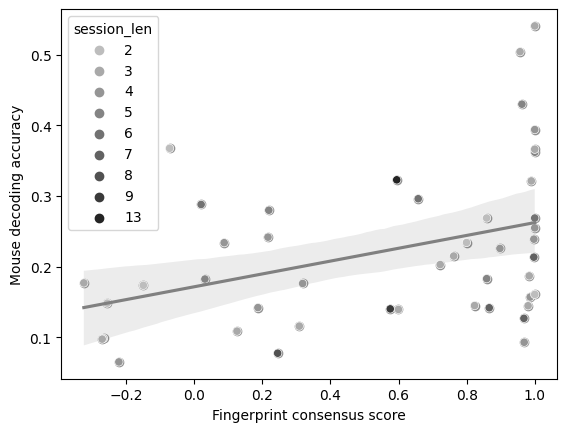

In [173]:
# # sns.scatterplot(x='accuracy', y='cos_sim', data=merged)
# sns.scatterplot(x='accuracy', y='norm_dif', data=merged, hue='session_len')
# data = merged.dropna()
# x = np.array(merged['norm_dif']).astype(float)
# y = np.array(merged['accuracy']).astype(float)
# res = stats.pearsonr(x, y)
# print(res)


sns.regplot(x=np.array(merged['norm_dif']).astype(float), y=merged['accuracy'].astype(float), ci=95, color='grey') 
sns.scatterplot(y='accuracy', x='norm_dif', hue='session_len', palette=palette, data=merged)

plt.xlabel('Fingerprint consensus score')
plt.ylabel('Mouse decoding accuracy')

data = merged.dropna()
x = np.array(merged['norm_dif']).astype(float)
y = np.array(merged['accuracy']).astype(float)
res = stats.pearsonr(x, y)
print(res)

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_44196/2145354447.py:3: UserWarning: The palette list has more values (10) than needed (9), which may not be intended.
  sns.scatterplot(y='accuracy', x='shuffle', hue='session_len', palette=palette, data=merged)


PearsonRResult(statistic=-0.48341231379853683, pvalue=0.000665969167944825)


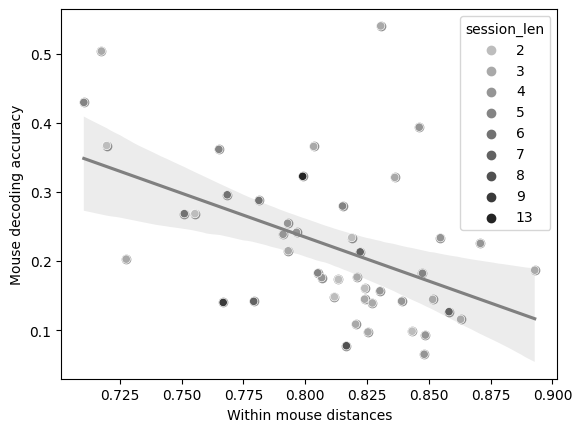

In [ ]:
sns.regplot(x=np.array(merged['shuffle']).astype(float), y=merged['accuracy'].astype(float), ci=95, color='grey') 
sns.scatterplot(y='accuracy', x='shuffle', hue='session_len', palette=palette, data=merged)

plt.xlabel('Within mouse distances')
plt.ylabel('Mouse decoding accuracy')

data = merged.dropna()
x = np.array(merged['shuffle']).astype(float)
y = np.array(merged['accuracy']).astype(float)
res = stats.pearsonr(x, y)
print(res)

## Correlation with learning time

In [14]:
data_path = prefix + 'representation_learning_variability/DATA/'
# data_path =  '/Users/ineslaranjeira/Documents/Repositories/representation_learning_variability/DATA/'
learning_df = pd.read_csv(data_path+'learning_private_one.csv')
learning_times = learning_df[['subject_nickname', 'training_time']].drop_duplicates()
learning_times = learning_times.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

data_path =  prefix + 'representation_learning_variability/DATA/'
learning_df = pd.read_parquet(data_path+'training_time_03-21-2025', engine='pyarrow')
learning_times_new = learning_df.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

# new_df = design_df.droplevel(1, axis=1)[['mouse_name', 'session']]
# df = new_df.merge(learning_times, on='mouse_name')
a = learning_times.merge(learning_times_new, on='mouse_name', how='outer')
b = a.loc[a['training_time_x'].isna()]
b = b.rename(columns={"training_time_y": "training_time"}).reset_index()
full_learning = pd.concat([learning_times[['mouse_name', 'training_time']], b[['mouse_name', 'training_time']]]).reset_index()

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_29223/3417959114.py:3: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  learning_df = pd.read_csv(data_path+'learning_private_one.csv')


In [83]:
learning_mouse_df = pivot_mouse_df.merge(full_learning, on='mouse_name')

PearsonRResult(statistic=0.14140465539940278, pvalue=0.04262281350864611)


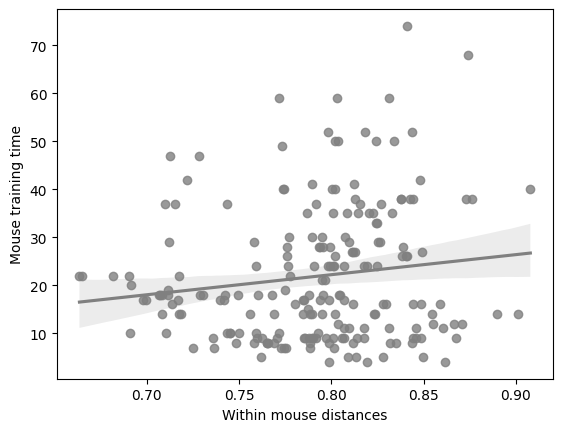

In [41]:
learning_mouse_df = a.merge(full_learning, on='mouse_name')
# learning_mouse_df = learning_mouse_df.groupby(['mouse_name', 'training_time'])[['cos_sim', 'shuffle']].mean().reset_index()
sns.regplot(x=np.array(learning_mouse_df['cos_sim']).astype(float), y=learning_mouse_df['training_time'].astype(float), ci=95, color='grey') 

plt.xlabel('Within mouse distances')
plt.ylabel('Mouse training time')

data = learning_mouse_df.dropna()
x = np.array(learning_mouse_df['cos_sim']).astype(float)
y = np.array(learning_mouse_df['training_time']).astype(float)
res = stats.pearsonr(x, y)
print(res)

PearsonRResult(statistic=0.11064179119745345, pvalue=0.3764783920767739)


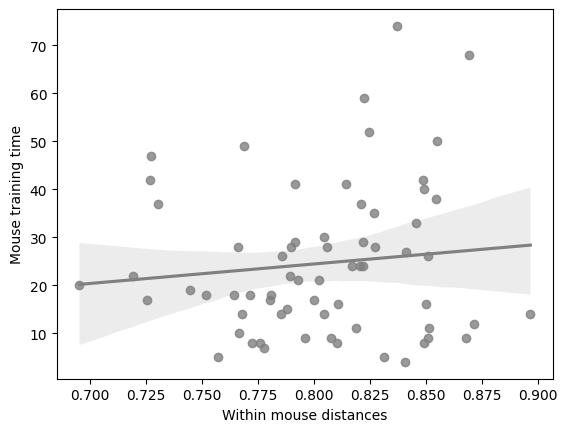

In [ ]:
learning_mouse_df = a.merge(full_learning, on='mouse_name')
# learning_mouse_df = learning_mouse_df.groupby(['mouse_name', 'training_time'])[['cos_sim', 'shuffle']].mean().reset_index()
sns.regplot(x=np.array(learning_mouse_df['shuffle']).astype(float), y=learning_mouse_df['training_time'].astype(float), ci=95, color='grey') 

plt.xlabel('Within mouse distances')
plt.ylabel('Mouse training time')

data = learning_mouse_df.dropna()
x = np.array(learning_mouse_df['shuffle']).astype(float)
y = np.array(learning_mouse_df['training_time']).astype(float)
res = stats.pearsonr(x, y)
print(res)

PearsonRResult(statistic=0.11064179119745345, pvalue=0.3764783920767739)

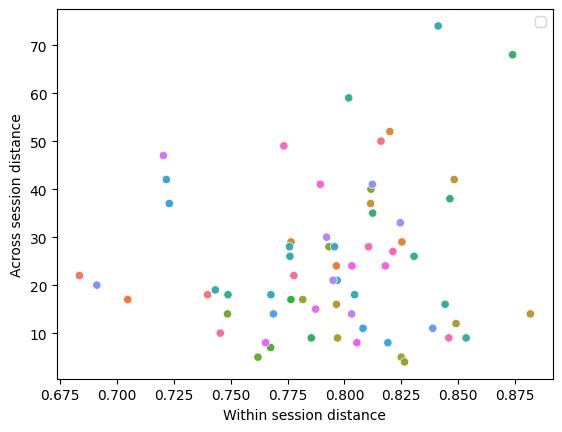

In [27]:
sns.scatterplot(x='cos_sim', y='training_time', hue='mouse_name', data=learning_mouse_df)
# plt.xlim([0.66, 0.92])
# plt.ylim([0.66, 0.92])
# plt.plot(np.arange(0, 1, 0.01), np.arange(0, 1, 0.01), color='grey', linewidth=.9, linestyle='dashed')
plt.legend('')
plt.xlabel('Within session distance')
plt.ylabel('Across session distance')

from scipy import stats

x = np.array(learning_mouse_df['shuffle']).astype(float)
y = np.array(learning_mouse_df['training_time']).astype(float)
res = stats.pearsonr(x, y)
res

# Correlation with accuracy

In [115]:
accuracy_df = complete_df[['mouse_name', 'session', 'feedback', 'trial_id']].drop_duplicates()
# accuracy_df = pd.DataFrame(accuracy_df.groupby(['mouse_name', 'session'])['feedback'].mean()).reset_index()
accuracy_df = pd.DataFrame(accuracy_df.groupby(['mouse_name'])['feedback'].mean()).reset_index()

In [116]:
plot_df = pivot_mouse_df.merge(accuracy_df, on='mouse_name')

PearsonRResult(statistic=np.float64(0.15038935379552634), pvalue=np.float64(0.21398814125054333))

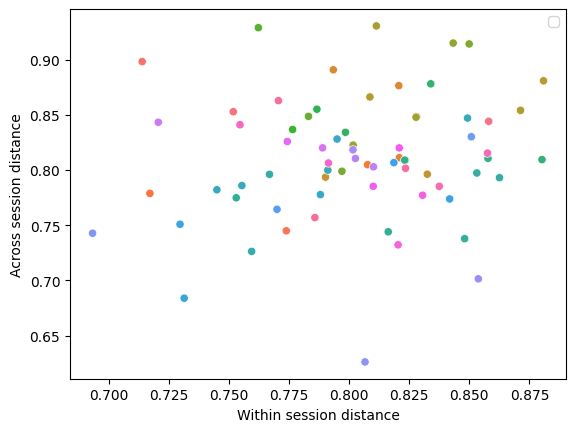

In [117]:
sns.scatterplot(x='shuffle', y='feedback', hue='mouse_name', data=plot_df)
# plt.xlim([0.66, 0.92])
# plt.ylim([0.66, 0.92])
# plt.plot(np.arange(0, 1, 0.01), np.arange(0, 1, 0.01), color='grey', linewidth=.9, linestyle='dashed')
plt.legend('')
plt.xlabel('Within session distance')
plt.ylabel('Across session distance')

from scipy import stats
x = np.array(plot_df['shuffle']).astype(float)
y = np.array(plot_df['feedback']).astype(float)
res = stats.pearsonr(x, y)
res

/tmp/ipykernel_7580/538850282.py:12: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:Grey'` for the same effect.

  sns.barplot(x='epoch', y='value', hue='Dataset', data=grouped_df, color='Grey',


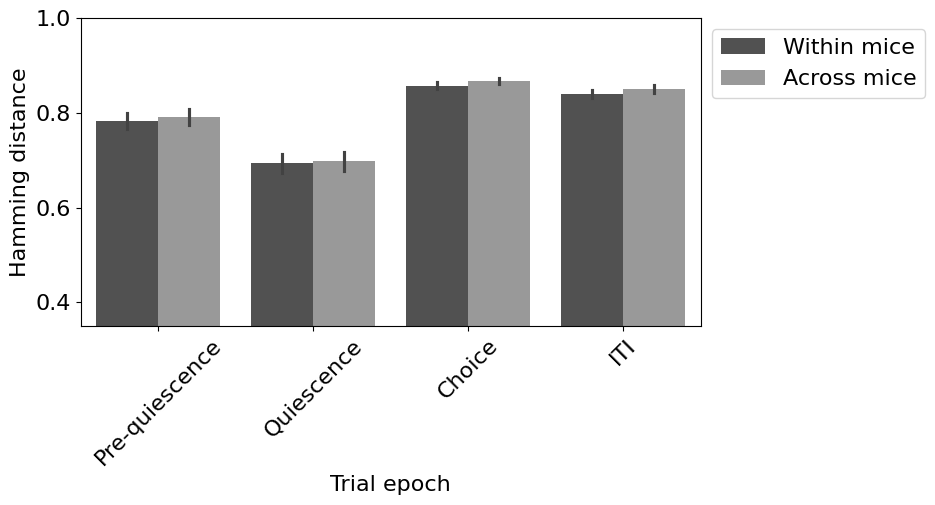

In [33]:
new_df = pd.melt(cos_sim, id_vars=['mouse_name','epoch'], value_vars=['cos_sim', 'shuffle'])
grouped_df = pd.DataFrame(new_df.groupby(['mouse_name', 'epoch', 'variable'])['value'].mean()).reset_index()

plt.rcParams.update({'font.size': 16})
grouped_df = grouped_df.rename(columns={"variable": "Dataset"})
grouped_df.loc[grouped_df['Dataset']=='cos_sim', 'Dataset'] = 'Within mice'
grouped_df.loc[grouped_df['Dataset']=='shuffle', 'Dataset'] = 'Across mice'

plt.figure(figsize=[8, 4])
# sns.barplot(x='epoch', y='value', hue='variable', data=grouped_df)
# sns.violinplot(x='epoch', y='value', hue='Dataset', data=grouped_df, color='Grey', alpha=.8)
sns.barplot(x='epoch', y='value', hue='Dataset', data=grouped_df, color='Grey', 
            order=['Pre-quiescence', 'Quiescence', 'Choice', 'ITI'], alpha=.8)
plt.xticks(rotation=45)
plt.ylim([.35, 1])
plt.xlabel('Trial epoch')
plt.ylabel('Hamming distance')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

/tmp/ipykernel_7580/1352990458.py:12: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:Grey'` for the same effect.

  sns.barplot(x='epoch', y='value', hue='Dataset', data=grouped_df, color='Grey',


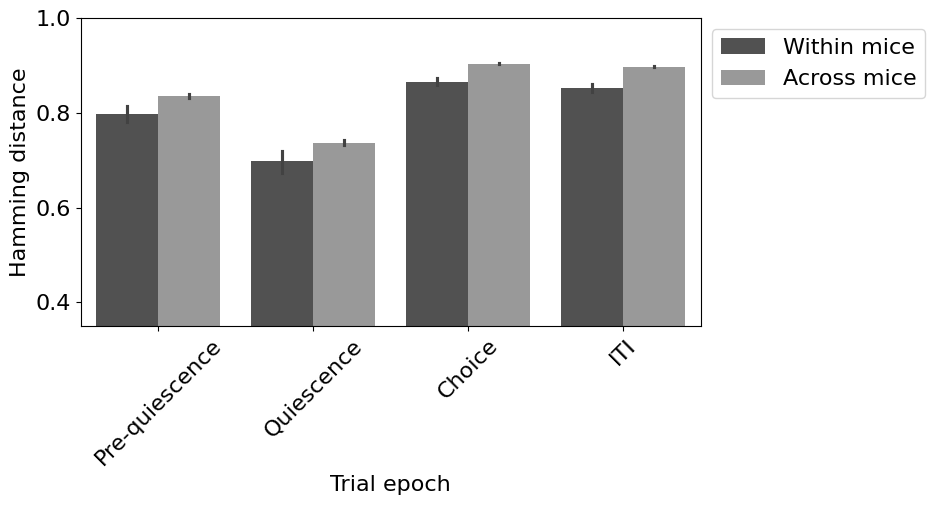

In [22]:
new_df = pd.melt(cos_sim, id_vars=['mouse_name', 'session', 'epoch'], value_vars=['cos_sim', 'shuffle'])
grouped_df = pd.DataFrame(new_df.groupby(['mouse_name', 'session', 'epoch', 'variable'])['value'].mean()).reset_index()

plt.rcParams.update({'font.size': 16})
grouped_df = grouped_df.rename(columns={"variable": "Dataset"})
grouped_df.loc[grouped_df['Dataset']=='cos_sim', 'Dataset'] = 'Within mice'
grouped_df.loc[grouped_df['Dataset']=='shuffle', 'Dataset'] = 'Across mice'

plt.figure(figsize=[8, 4])
# sns.barplot(x='epoch', y='value', hue='variable', data=grouped_df)
# sns.violinplot(x='epoch', y='value', hue='Dataset', data=grouped_df, color='Grey', alpha=.8)
sns.barplot(x='epoch', y='value', hue='Dataset', data=grouped_df, color='Grey', 
            order=['Pre-quiescence', 'Quiescence', 'Choice', 'ITI'], alpha=.8)
plt.xticks(rotation=45)
plt.ylim([.35, 1])
plt.xlabel('Trial epoch')
plt.ylabel('Hamming distance')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

## Get sequences per trial

In [104]:
var_interest = 'block'
var_interest = ''
if len(var_interest) > 0:
    pivoted_df = complete_df.pivot(index=['sample', 'trial_type', 'mouse_name', 'session', var_interest], columns=['broader_label'], values='binned_sequence').reset_index().dropna()
else:
    pivoted_df = complete_df.pivot(index=['sample', 'trial_type', 'mouse_name', 'session'], columns=['broader_label'], values='binned_sequence').reset_index().dropna()
pivoted_df = pivoted_df.merge(cluster_df[['mouse_name', 'session', 'session_cluster']], on=['mouse_name', 'session'])

In [105]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

sequences_choice = np.vstack(pivoted_df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]

use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]
binarized = np.zeros((np.shape(use_sequences)[0], timesteps*use_states))

for t in range(timesteps):
    label_binarizer = LabelBinarizer()
    label_binarizer.fit(range(use_states))
    encoded_arr = label_binarizer.transform(use_sequences[:, t])
    binarized[:, t*use_states:(t+1)*use_states] = encoded_arr

final_matrix = binarized.copy()

In [122]:

session_syllables = pd.DataFrame(final_matrix)
session_syllables['session'] = pivoted_df['session'].copy()
session_syllables['session_cluster'] = pivoted_df['session_cluster'].copy()
session_syllables['mouse_name'] = pivoted_df['mouse_name'].copy()
use_states = len(np.unique(sequences_choice))

if len(var_interest) > 0:
    session_syllables[var_interest] = pivoted_df[var_interest].copy()
    reshaped_probs = group_by_var_interest(session_syllables, var_interest, use_states)
else:
    reshaped_probs = group_by_cluster(session_syllables, use_states)
clusters = cluster_df['session_cluster']

/tmp/ipykernel_16422/1546797968.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  reshaped_probs_cluster['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '400', '500', '600', '700', '010', '110',
/tmp/ipykernel_16

In [123]:
order = ['000', '010', '001', '011', '100', '110', '101', '111', '200', '210', '201', '211',
         '300', '310', '301', '311', '400', '410',  '401', '411',
         '500', '510', '501', '511', '600', '610', '601', '611',
         '700', '710', '701', '711']
labels = ['VL00', 'VL10', 'VL01', 'VL11', 'Low00', 'Low10',  'Low01', 'Low11',
         'Lowish00', 'Lowish10', 'Lowish01', 'Lowish11', 
         'LL-00', 'LL-10', 'LL-01', 'LL-11', 'LR-00', 'LR-10', 'LR-01', 'LR-11', 
         'HL-00', 'HL-10', 'HL-01', 'HL-11', 'HR-00', 'HR-10', 'HR-01', 'HR-11', 
         'H-00', 'H-10', 'H-01', 'H-11']
rename_labels = dict(zip(np.array(order), np.array(labels)))
rename_func = np.vectorize(rename_labels.get)

In [124]:
palette_30 = create_grouped_gradient_palette(n_groups=8, shades_per_group=4, base_palette='Set1')
palette_30_list = [palette_30(i) for i in range(palette_30.N)]  # Extract colors properly

palette_16 = create_grouped_gradient_palette(n_groups=2, shades_per_group=4, base_palette='Set1')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
state_to_color = dict(zip(order, palette_16_list))

/tmp/ipykernel_16422/1847124971.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  use_data['syllable'] = rename_func(use_data['syllable'])
/tmp/ipykernel_16422/1847124971.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  use_data['syllable'] = rename_func(use_data['syllable'])
/tmp/ipykernel_16422/1847124971.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

IndexError: list index out of range

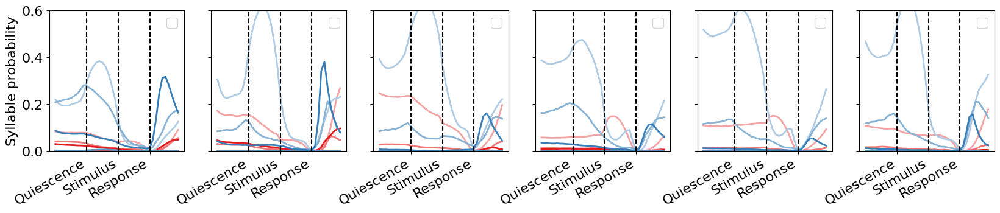

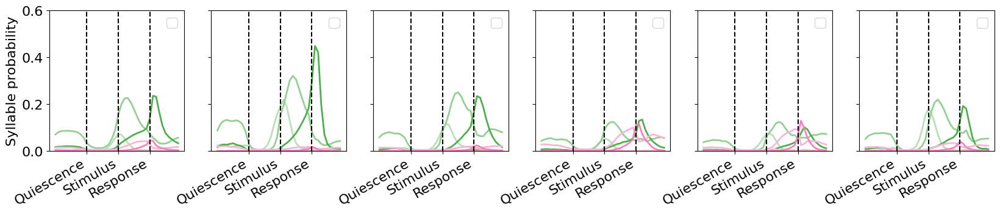

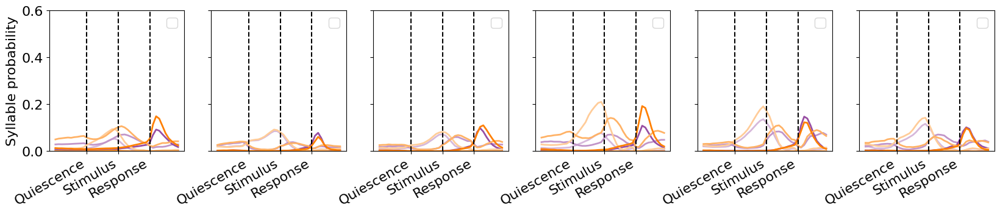

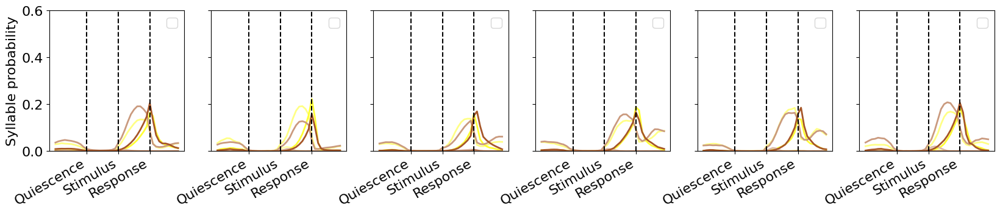

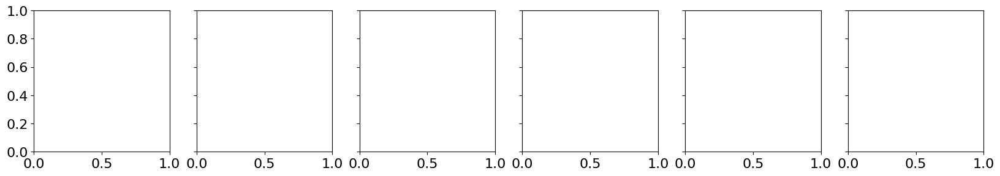

In [142]:
paw_syllable = [['VL00', 'VL10', 'VL01', 'VL11',
                'Low00', 'Low10',  'Low01', 'Low11'],
                ['Lowish00', 'Lowish10', 'Lowish01', 'Lowish11', 'H-00', 'H-10', 'H-01', 'H-11'],
                ['LL-00', 'LL-10', 'LL-01', 'LL-11', 'LR-00', 'LR-10', 'LR-01', 'LR-11'],
                ['HL-00', 'HL-10', 'HL-01', 'HL-11', 'HR-00', 'HR-10', 'HR-01', 'HR-11'],
                
                ]
for i in range(6):

    fig, axs = plt.subplots(1, 6, sharex=True, sharey=True, figsize=(20, 3))

    for c, cluster in enumerate(np.unique(clusters)):
        use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
        use_data['syllable'] = rename_func(use_data['syllable'])
        use_syllables = paw_syllable[i]
        use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
        sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                    ax=axs[c], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]  style=var_interest,

        axs[c].axvline(x=10, color='k', linestyle='--')
        axs[c].axvline(x=20, color='k', linestyle='--')
        axs[c].axvline(x=30, color='k', linestyle='--')
        axs[c].set_ylabel('Syllable probability')
        axs[c].set_xlabel('')
        axs[c].set_ylim([0, 0.6])
        axs[c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
        axs[c].legend('')
axs[c].legend(loc='upper left', bbox_to_anchor=(1.1, 1))

# Plot statistics per fingerprint

In [94]:
trials_df = complete_df.drop(columns=['broader_label', 'binned_sequence']).drop_duplicates()
trials_df = trials_df.merge(cluster_df[['mouse_name', 'session', 'session_cluster']], on=['mouse_name', 'session'])


,mouse_name,trial_type,sample,feedback,choice,block,contrast,side,session,trial_id,session_cluster
0,ZFM-02372,correct 0.25 0.5 right,88224abb-5746-431f-9c17-17d7ef806e6a 1.0,1,1,0.5,0.2500,left,88224abb-5746-431f-9c17-17d7ef806e6a,1.0,3
1,ZFM-02372,correct 0.0625 0.5 right,88224abb-5746-431f-9c17-17d7ef806e6a 10.0,1,1,0.5,0.0625,left,88224abb-5746-431f-9c17-17d7ef806e6a,10.0,3
2,ZFM-02372,correct 0.25 0.8 left,88224abb-5746-431f-9c17-17d7ef806e6a 100.0,1,0,0.8,0.2500,right,88224abb-5746-431f-9c17-17d7ef806e6a,100.0,3
3,ZFM-02372,correct 0.25 0.8 right,88224abb-5746-431f-9c17-17d7ef806e6a 101.0,1,1,0.8,0.2500,left,88224abb-5746-431f-9c17-17d7ef806e6a,101.0,3
4,ZFM-02372,correct 1.0 0.8 left,88224abb-5746-431f-9c17-17d7ef806e6a 102.0,1,0,0.8,1.0000,right,88224abb-5746-431f-9c17-17d7ef806e6a,102.0,3
...,...,...,...,...,...,...,...,...,...,...,...
135780,NYU-30,correct 0.25 0.2 left,5569f363-0934-464e-9a5b-77c8e67791a1 95.0,1,0,0.2,0.2500,right,5569f363-0934-464e-9a5b-77c8e67791a1,95.0,0
135781,NYU-30,correct 1.0 0.2 right,5569f363-0934-464e-9a5b-77c8e67791a1 96.0,1,1,0.2,1.0000,left,5569f363-0934-464e-9a5b-77c8e67791a1,96.0,0
135782,NYU-30,incorrect 0.125 0.2 right,5569f363-0934-464e-9a5b-77c8e67791a1 97.0,0,1,0.2,0.1250,right,5569f363-0934-464e-9a5b-77c8e67791a1,97.0,0
135783,NYU-30,correct 1.0 0.2 left,5569f363-0934-464e-9a5b-77c8e67791a1 98.0,1,0,0.2,1.0000,right,5569f363-0934-464e-9a5b-77c8e67791a1,98.0,0


In [132]:
# Get timing info
data_path = prefix + 'representation_learning_variability/paper-individuality/fig1_segmentation/'
states_file = pd.read_parquet(data_path+'states_trial_type_09-29-2025')
vars = ['trial_id', 'session', 'mouse_name']
elongation = pd.DataFrame(states_file.groupby(vars)['elongation'].mean()).reset_index()
elongation['trial_id'] = elongation['trial_id'].astype(str)
response = pd.DataFrame(states_file.groupby(vars)['response'].mean()).reset_index()
response['trial_id'] = response['trial_id'].astype(str)
reaction = pd.DataFrame(states_file.groupby(vars)['reaction'].mean()).reset_index()
reaction['trial_id'] = reaction['trial_id'].astype(str)

del states_file

# Merge
trials_df = trials_df.merge(elongation, on=['session', 'trial_id', 'mouse_name'])
trials_df = trials_df.merge(response, on=['session', 'trial_id', 'mouse_name'])
trials_df = trials_df.merge(reaction, on=['session', 'trial_id', 'mouse_name'])

In [152]:
data_path = prefix + 'representation_learning_variability/DATA/'
# data_path =  '/Users/ineslaranjeira/Documents/Repositories/representation_learning_variability/DATA/'
learning_df = pd.read_csv(data_path+'learning_private_one.csv')
learning_times = learning_df[['subject_nickname', 'training_time']].drop_duplicates()
learning_times = learning_times.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

data_path =  prefix + 'representation_learning_variability/DATA/'
learning_df = pd.read_parquet(data_path+'training_time_03-21-2025', engine='pyarrow')
learning_times_new = learning_df.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

# new_df = design_df.droplevel(1, axis=1)[['mouse_name', 'session']]
# df = new_df.merge(learning_times, on='mouse_name')
a = learning_times.merge(learning_times_new, on='mouse_name', how='outer')
b = a.loc[a['training_time_x'].isna()]
b = b.rename(columns={"training_time_y": "training_time"}).reset_index()

full_learning = pd.concat([learning_times[['mouse_name', 'training_time']], b[['mouse_name', 'training_time']]]).reset_index()

/tmp/ipykernel_16422/1096352341.py:3: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  learning_df = pd.read_csv(data_path+'learning_private_one.csv')


In [155]:
trials_df = trials_df.merge(full_learning[['mouse_name', 'training_time']], on='mouse_name')

/tmp/ipykernel_16422/2735069268.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='session_cluster', y=var, data=data, palette=sns.light_palette("seagreen", 3, as_cmap=False))
/tmp/ipykernel_16422/2735069268.py:34: UserWarning: 
The palette list has fewer values (3) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(x='session_cluster', y=var, data=data, palette=sns.light_palette("seagreen", 3, as_cmap=False))


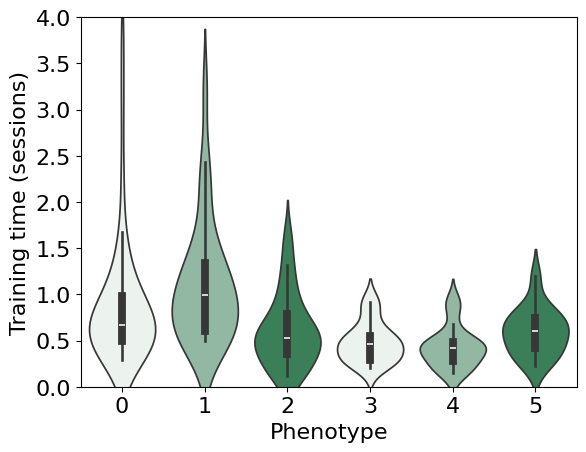

P-value for KW: 0.000
          0             1         2         3             4         5
0  1.000000  3.586931e-01  0.172859  0.008327  2.087473e-05  1.000000
1  0.358693  1.000000e+00  0.000468  0.000021  1.840221e-08  0.053904
2  0.172859  4.684424e-04  1.000000  1.000000  3.969630e-01  1.000000
3  0.008327  2.103129e-05  1.000000  1.000000  1.000000e+00  1.000000
4  0.000021  1.840221e-08  0.396963  1.000000  1.000000e+00  0.737503
5  1.000000  5.390384e-02  1.000000  1.000000  7.375033e-01  1.000000


In [160]:
# --Machine learning and statistics
from scipy.stats import ttest_ind
from sklearn.metrics import f1_score
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
import scikit_posthocs as sp
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy import stats

var_1 = 'training_time ~ session_cluster'
var = 'training_time'
var = 'elongation'
var_1 = 'elongation ~ session_cluster'

data = pd.DataFrame(trials_df.groupby(['mouse_name', 'session', 'session_cluster'])[var].mean()).reset_index().dropna()
# data = pd.DataFrame(trials_df.groupby(['mouse_name', 'session_cluster'])[var].mean()).reset_index().dropna()
# data = pd.DataFrame(new_df.groupby(['mouse_name', 'session_cluster'])[var].mean()).reset_index().dropna()
# data = data[['session_cluster', var]]
data[var] = data[var].astype(float)

model = ols(var_1, data=data).fit()

# # Perform the ANOVA
# anova_table = sm.stats.anova_lm(model, typ=2)  # Type 2 ANOVA DataFrame
# # print(anova_table)

# # Perform Tukey's HSD test
# tukey = pairwise_tukeyhsd(endog=data[var], groups=data['session_cluster'], alpha=0.05)
# print(tukey)

plt.rcParams.update({'font.size': 16})
sns.violinplot(x='session_cluster', y=var, data=data, palette=sns.light_palette("seagreen", 3, as_cmap=False))
# sns.barplot(x='session_cluster', y=var, data=data, palette=sns.light_palette("seagreen", 3, as_cmap=False))
# sns.scatterplot(x='part_cluster', y=var, data=data, color='black')
plt.xticks([0, 1, 2, 3, 4, 5], [0, 1, 2, 3, 4, 5])
plt.ylim([0, 80])
plt.ylim([0, 4])
# plt.ylim([0.5, 1])
# plt.ylim([0, 1])
plt.xlabel('Phenotype')
plt.ylabel('Proportion correct')
plt.ylabel('Training time (sessions)')
plt.show()

group_1 = data.loc[data['session_cluster']==0, var]
group_2 = data.loc[data['session_cluster']==1, var]
group_3 = data.loc[data['session_cluster']==2, var]
group_4 = data.loc[data['session_cluster']==3, var]
group_5 = data.loc[data['session_cluster']==4, var]


stat, p_value = stats.kruskal(group_1, group_2, group_3, group_4, group_5)


print(f"P-value for KW: {p_value:.3f}")

posthoc = sp.posthoc_dunn(data.dropna(), val_col=var, group_col='session_cluster', p_adjust='bonferroni')
print(posthoc)

## Analyse clusters

(array([73.,  0., 31.,  0., 39.,  0., 24.,  0., 36., 15.]),
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. ]),
 <BarContainer object of 10 artists>)

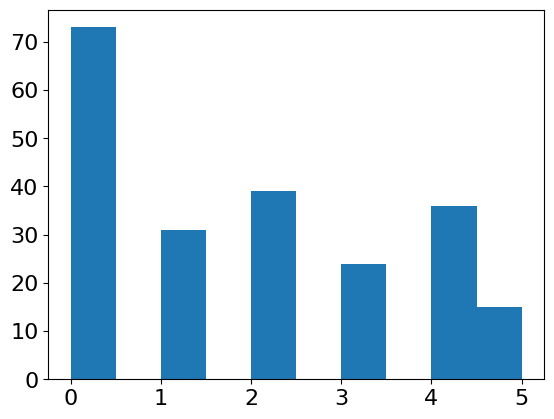

In [28]:
plt.hist(cluster_df['session_cluster'])

In [97]:
clusters = cluster_df['session_cluster']
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

sequences_choice = np.vstack(design_df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]


In [18]:
use_states = len(np.unique(sequences_choice))
timesteps = 40
reshaped_probs = pd.DataFrame()

for c, cluster in enumerate(np.unique(clusters)):
    reshaped_probs_cluster = pd.DataFrame(columns=['syllable', 'timestep', 'cluster', 'prob'], index=range(use_states * timesteps))
    indices = np.where(clusters==cluster)[0]
    syllable_prob = np.array(cluster_df[cluster_df.keys()[2:-1]])[indices, :].mean(axis=0)

    for t in range(timesteps):
        reshaped_probs_cluster['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '400', '500', '600', '700', '010', '110',
                     '210', '310', '410', '510', '610', '710', '001', '101', '201', '301', '401', '501', '601', '701', '011',
                     '111', '211', '311', '411', '511',  '611',  '711']
        reshaped_probs_cluster['timestep'][t*use_states:(t+1)*use_states] = t
        reshaped_probs_cluster['prob'][t*use_states:(t+1)*use_states] = syllable_prob[t*use_states:(t+1)*use_states]
        reshaped_probs_cluster['cluster'][t*use_states:(t+1)*use_states] = cluster
    # Save
    reshaped_probs = pd.concat([reshaped_probs, reshaped_probs_cluster])

/tmp/ipykernel_3392/478142897.py:11: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  reshaped_probs_cluster['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '400', '500', '600', '700', '010', '110',
/tmp/ipykernel_3392

In [19]:
order = ['000', '010', '001', '011', '100', '110', '101', '111', '200', '210', '201', '211',
         '300', '310', '301', '311', '400', '410',  '401', '411',
         '500', '510', '501', '511', '600', '610', '601', '611',
         '700', '710', '701', '711']
labels = ['VL00', 'VL10', 'VL01', 'VL11', 'Low00', 'Low10',  'Low01', 'Low11',
         'Lowish00', 'Lowish10', 'Lowish01', 'Lowish11', 
         'LL-00', 'LL-10', 'LL-01', 'LL-11', 'LR-00', 'LR-10', 'LR-01', 'LR-11', 
         'HL-00', 'HL-10', 'HL-01', 'HL-11', 'HR-00', 'HR-10', 'HR-01', 'HR-11', 
         'H-00', 'H-10', 'H-01', 'H-11']
rename_labels = dict(zip(np.array(order), np.array(labels)))
rename_func = np.vectorize(rename_labels.get)

In [36]:
palette_30 = create_grouped_gradient_palette(n_groups=8, shades_per_group=4, base_palette='Set1')
palette_30_list = [palette_30(i) for i in range(palette_30.N)]  # Extract colors properly


/tmp/ipykernel_3392/1005566243.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  use_data['syllable'] = rename_func(use_data['syllable'])
/tmp/ipykernel_3392/1005566243.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  use_data['syllable'] = rename_func(use_data['syllable'])
/tmp/ipykernel_3392/1005566243.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://

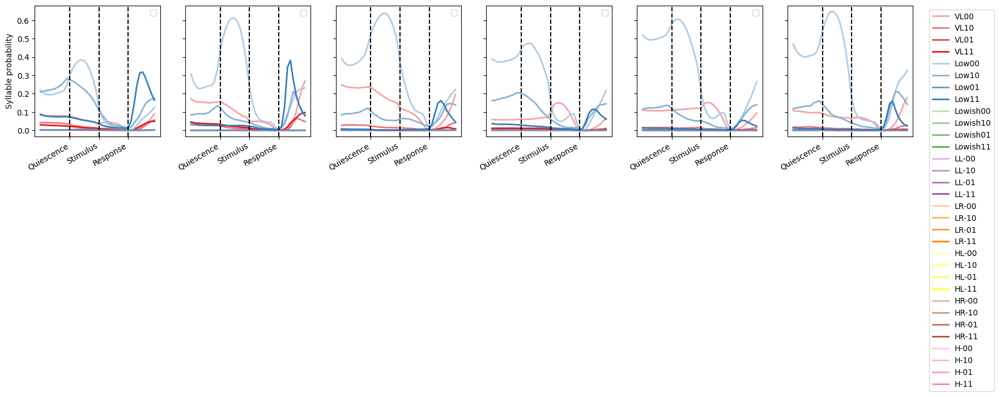

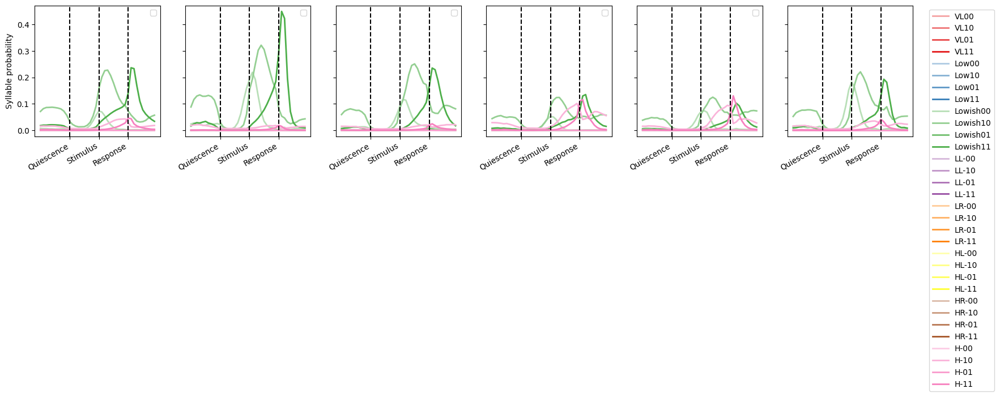

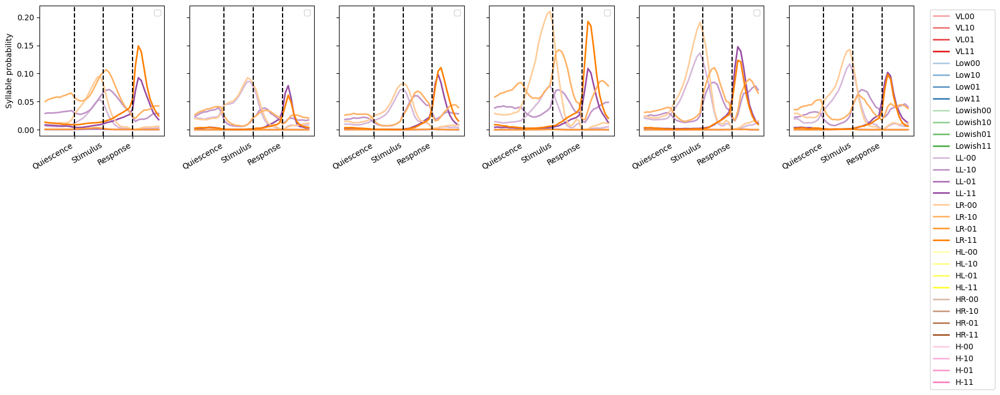

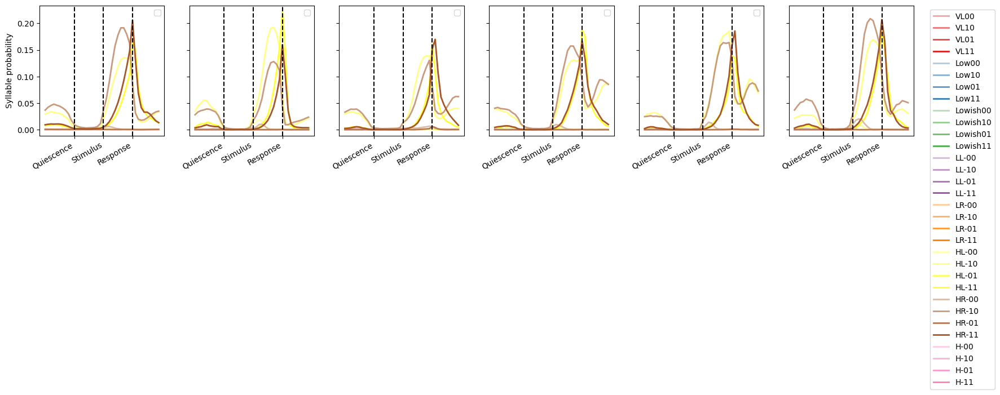

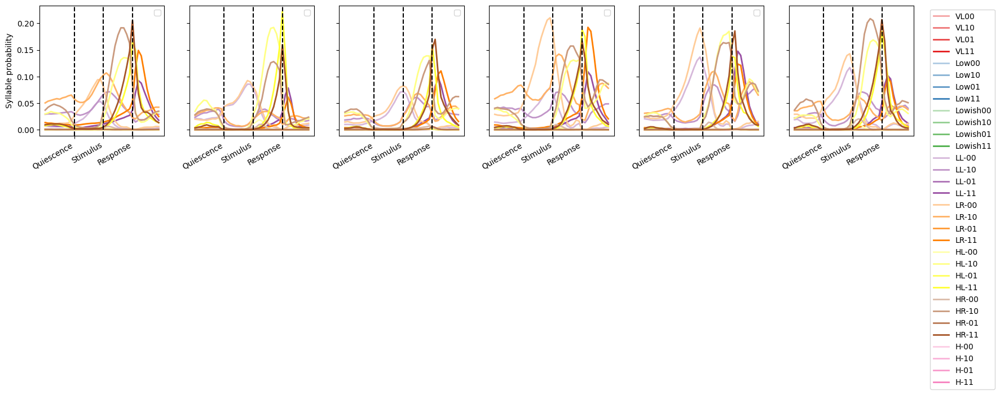

In [40]:
palette_16 = create_grouped_gradient_palette(n_groups=2, shades_per_group=4, base_palette='Set1')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
state_to_color = dict(zip(order, palette_16_list))

fig, axs = plt.subplots(1, 6, sharex=True, sharey=True, figsize=(20, 3))

for c, cluster in enumerate(np.unique(clusters)):
    use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
    use_data['syllable'] = rename_func(use_data['syllable'])
    use_syllables = ['VL00', 'VL10', 'VL01', 'VL11', 'Low00', 'Low10',  'Low01', 'Low11']
    use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
    sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                ax=axs[c], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]

    axs[c].axvline(x=10, color='k', linestyle='--')
    axs[c].axvline(x=20, color='k', linestyle='--')
    axs[c].axvline(x=30, color='k', linestyle='--')
    axs[c].set_ylabel('Syllable probability')
    axs[c].set_xlabel('')
    axs[c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[c].legend('')
axs[c].legend(loc='upper left', bbox_to_anchor=(1.1, 1))

fig, axs = plt.subplots(1, 6, sharex=True, sharey=True, figsize=(20, 3))
for c, cluster in enumerate(np.unique(clusters)):
    use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
    use_data['syllable'] = rename_func(use_data['syllable'])
    use_syllables = ['Lowish00', 'Lowish10', 'Lowish01', 'Lowish11', 'H-00', 'H-10', 'H-01', 'H-11']
    use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
    sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                ax=axs[c], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]

    axs[c].axvline(x=10, color='k', linestyle='--')
    axs[c].axvline(x=20, color='k', linestyle='--')
    axs[c].axvline(x=30, color='k', linestyle='--')
    axs[c].set_ylabel('Syllable probability')
    axs[c].set_xlabel('')
    axs[c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[c].legend('')
axs[c].legend(loc='upper left', bbox_to_anchor=(1.1, 1))


fig, axs = plt.subplots(1, 6, sharex=True, sharey=True, figsize=(20, 3))
for c, cluster in enumerate(np.unique(clusters)):
    use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
    use_data['syllable'] = rename_func(use_data['syllable'])
    use_syllables = ['LL-00', 'LL-10', 'LL-01', 'LL-11', 'LR-00', 'LR-10', 'LR-01', 'LR-11']
    use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
    sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                ax=axs[c], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]

    axs[c].axvline(x=10, color='k', linestyle='--')
    axs[c].axvline(x=20, color='k', linestyle='--')
    axs[c].axvline(x=30, color='k', linestyle='--')
    axs[c].set_ylabel('Syllable probability')
    axs[c].set_xlabel('')
    axs[c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[c].legend('')
axs[c].legend(loc='upper left', bbox_to_anchor=(1.1, 1))


fig, axs = plt.subplots(1, 6, sharex=True, sharey=True, figsize=(20, 3))
for c, cluster in enumerate(np.unique(clusters)):
    use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
    use_data['syllable'] = rename_func(use_data['syllable'])
    use_syllables = ['HL-00', 'HL-10', 'HL-01', 'HL-11', 'HR-00', 'HR-10', 'HR-01', 'HR-11']
    use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
    sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                ax=axs[c], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]

    axs[c].axvline(x=10, color='k', linestyle='--')
    axs[c].axvline(x=20, color='k', linestyle='--')
    axs[c].axvline(x=30, color='k', linestyle='--')
    axs[c].set_ylabel('Syllable probability')
    axs[c].set_xlabel('')
    axs[c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[c].legend('')
axs[c].legend(loc='upper left', bbox_to_anchor=(1.1, 1))

fig, axs = plt.subplots(1, 6, sharex=True, sharey=True, figsize=(20, 3))
for c, cluster in enumerate(np.unique(clusters)):
    use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
    use_data['syllable'] = rename_func(use_data['syllable'])
    use_syllables = ['LL-00', 'LL-10', 'LL-01', 'LL-11', 'LR-00', 'LR-10', 'LR-01', 'LR-11',
                     'HL-00', 'HL-10', 'HL-01', 'HL-11', 'HR-00', 'HR-10', 'HR-01', 'HR-11']
    use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
    sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                ax=axs[c], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]

    axs[c].axvline(x=10, color='k', linestyle='--')
    axs[c].axvline(x=20, color='k', linestyle='--')
    axs[c].axvline(x=30, color='k', linestyle='--')
    axs[c].set_ylabel('Syllable probability')
    axs[c].set_xlabel('')
    axs[c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[c].legend('')
axs[c].legend(loc='upper left', bbox_to_anchor=(1.1, 1))


/tmp/ipykernel_3392/2453833915.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  use_data['syllable'] = rename_func(use_data['syllable'])
/tmp/ipykernel_3392/2453833915.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  use_data['syllable'] = rename_func(use_data['syllable'])
/tmp/ipykernel_3392/2453833915.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

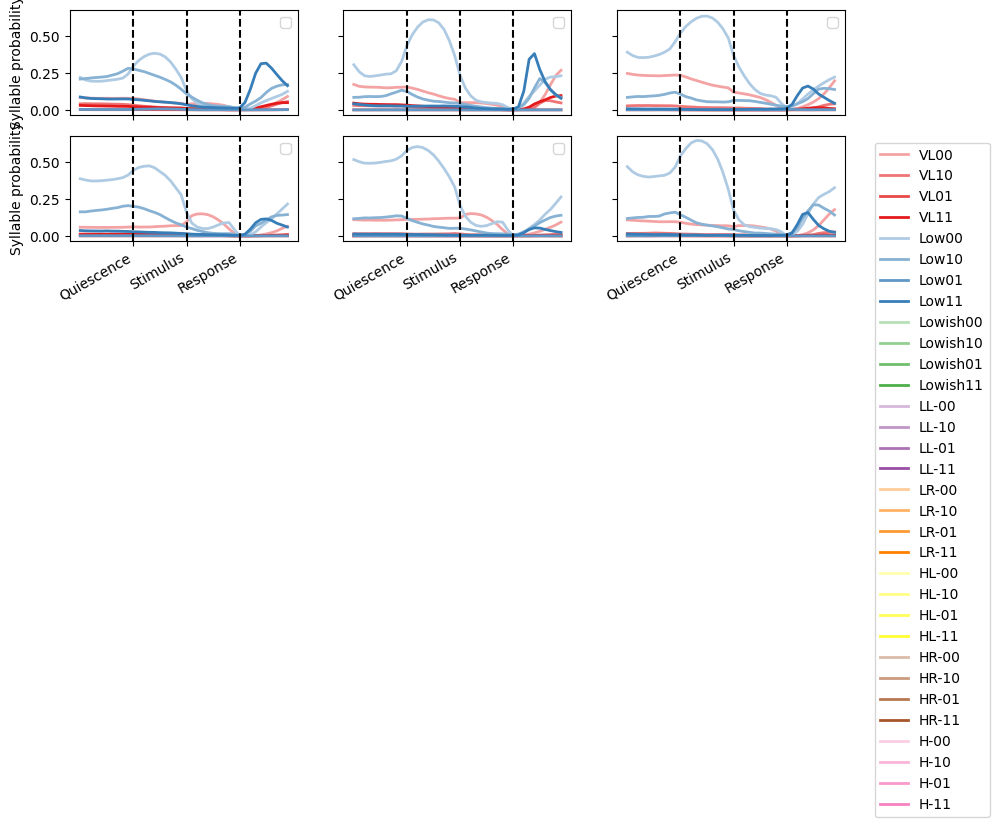

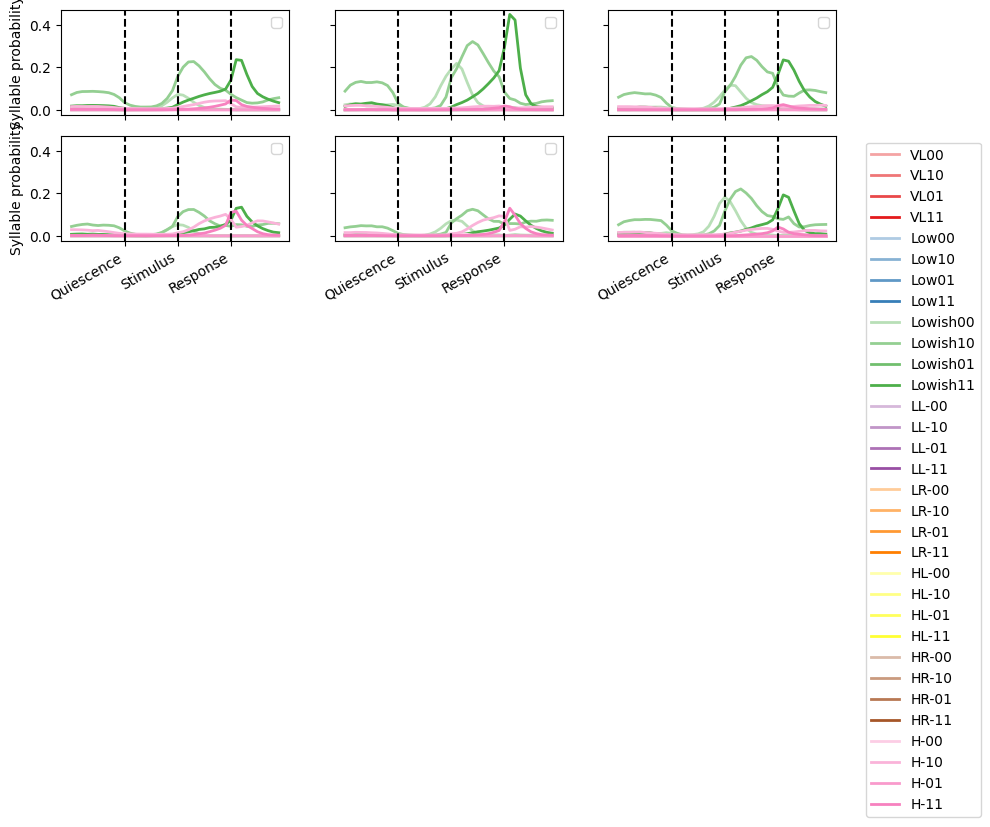

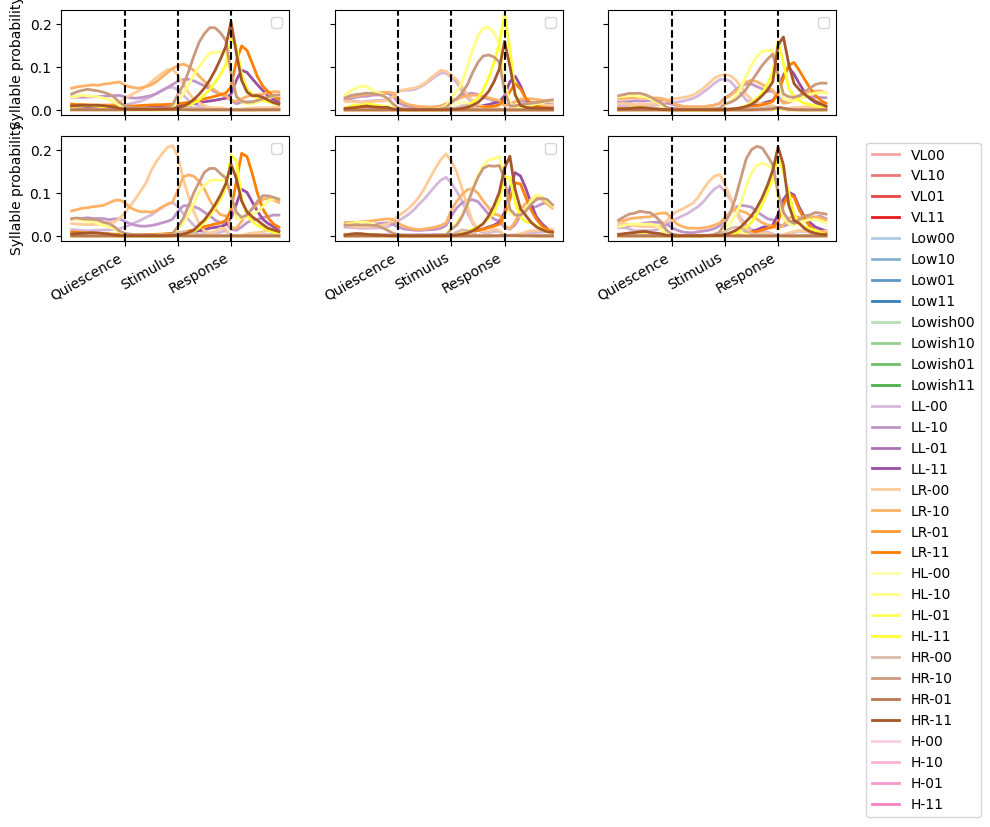

In [37]:
palette_16 = create_grouped_gradient_palette(n_groups=2, shades_per_group=4, base_palette='Set1')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
state_to_color = dict(zip(order, palette_16_list))

fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(10, 3))
ax_x = [0, 0, 0, 1, 1, 1]
ax_y = [0, 1, 2, 0, 1, 2]
for c, cluster in enumerate(np.unique(clusters)):
    use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
    use_data['syllable'] = rename_func(use_data['syllable'])
    use_syllables = ['VL00', 'VL10', 'VL01', 'VL11', 'Low00', 'Low10',  'Low01', 'Low11']
    use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
    sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                ax=axs[ax_x[c], ax_y[c]], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]

    axs[ax_x[c], ax_y[c]].axvline(x=10, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].axvline(x=20, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].axvline(x=30, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].set_ylabel('Syllable probability')
    axs[ax_x[c], ax_y[c]].set_xlabel('')
    axs[ax_x[c], ax_y[c]].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[ax_x[c], ax_y[c]].legend('')
axs[ax_x[c], ax_y[c]].legend(loc='upper left', bbox_to_anchor=(1.1, 1))


palette_16 = create_grouped_gradient_palette(n_groups=2, shades_per_group=4, base_palette='Set1')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
state_to_color = dict(zip(order, palette_16_list))
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(10, 3))
for c, cluster in enumerate(np.unique(clusters)):
    use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
    use_data['syllable'] = rename_func(use_data['syllable'])
    use_syllables = ['Lowish00', 'Lowish10', 'Lowish01', 'Lowish11', 'H-00', 'H-10', 'H-01', 'H-11']
    use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
    sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                ax=axs[ax_x[c], ax_y[c]], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]

    axs[ax_x[c], ax_y[c]].axvline(x=10, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].axvline(x=20, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].axvline(x=30, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].set_ylabel('Syllable probability')
    axs[ax_x[c], ax_y[c]].set_xlabel('')
    axs[ax_x[c], ax_y[c]].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[ax_x[c], ax_y[c]].legend('')
axs[ax_x[c], ax_y[c]].legend(loc='upper left', bbox_to_anchor=(1.1, 1))

palette_16 = create_grouped_gradient_palette(n_groups=4, shades_per_group=4, base_palette='Set1')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
state_to_color = dict(zip(order, palette_16_list))
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(10, 3))
for c, cluster in enumerate(np.unique(clusters)):
    use_data = reshaped_probs.loc[reshaped_probs['cluster']==cluster]
    use_data['syllable'] = rename_func(use_data['syllable'])
    use_syllables = ['LL-00', 'LL-10', 'LL-01', 'LL-11', 'LR-00', 'LR-10', 'LR-01', 'LR-11', 
         'HL-00', 'HL-10', 'HL-01', 'HL-11', 'HR-00', 'HR-10', 'HR-01', 'HR-11']
    use_data = use_data.loc[use_data['syllable'].isin(use_syllables)]
    sns.lineplot(x='timestep', y='prob', hue='syllable', data=use_data, 
                ax=axs[ax_x[c], ax_y[c]], palette=palette_30_list, hue_order=labels, linewidth=2)  #  legend=labels[c]

    axs[ax_x[c], ax_y[c]].axvline(x=10, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].axvline(x=20, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].axvline(x=30, color='k', linestyle='--')
    axs[ax_x[c], ax_y[c]].set_ylabel('Syllable probability')
    axs[ax_x[c], ax_y[c]].set_xlabel('')
    axs[ax_x[c], ax_y[c]].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[ax_x[c], ax_y[c]].legend('')
axs[ax_x[c], ax_y[c]].legend(loc='upper left', bbox_to_anchor=(1.1, 1))


/tmp/ipykernel_3392/3618640292.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='prob', data=importances_syllable.loc[importances_syllable['cluster']==c],
/tmp/ipykernel_3392/3618640292.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='prob', data=importances_syllable.loc[importances_syllable['cluster']==c],
/tmp/ipykernel_3392/3618640292.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='prob', data=importances_syllable.loc[importances_syllable['cluster']==c],
/tmp/ipykernel_3392/3618640292.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='prob', data=importances_syllable.loc[importances_syllable['cluster']==c],
/tmp/ipykernel_3392/3618640292.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
 

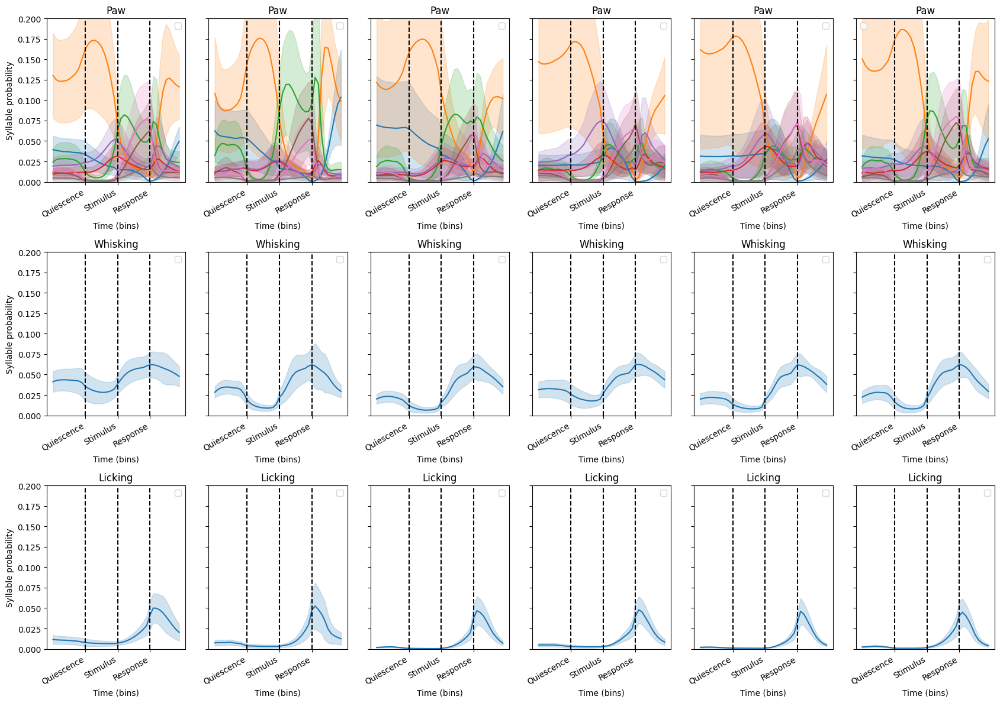

In [23]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set1", 8, as_cmap=False)
palette_16 = create_grouped_gradient_palette(n_groups=8, shades_per_group=1, base_palette='Set1')
color = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
fig, axs = plt.subplots(3, len(np.unique(clusters)), sharex=False, sharey=True, figsize=(17, 12))
syllables = np.array([[int(d) for d in s] for s in reshaped_probs['syllable']])
titles = ['Paw', 'Whisking', 'Licking']
for c in range(len(np.unique(clusters))):
    for i in range(3):
        unique_syllable_digits = np.unique(syllables[:, i])
        # if i == 0:
        #     unique_syllable_digits = np.sort(paw_func(unique_syllable_digits))
        for u in unique_syllable_digits:
            if len(unique_syllable_digits)==2 and u == 0:
                continue
            syllable_interest = np.where(syllables[:, i]==u)
            importances_syllable = reshaped_probs.reset_index().loc[syllable_interest]
            # remapped_paw_syllable = paw_func(u)
            remapped_paw_syllable = u
            # sns.lineplot(x='timestep', y='prob', data=importances_syllable.loc[importances_syllable['cluster']==c], 
            #     ax=axs[i, c], errorbar='se', palette=color[u], label=str(remapped_paw_syllable))
            sns.lineplot(x='timestep', y='prob', data=importances_syllable.loc[importances_syllable['cluster']==c], 
                ax=axs[i, c], errorbar='se', palette=color, label=str(remapped_paw_syllable))
        axs[i, c].set_title(titles[i])
        axs[i, c].set_ylim([0, 0.2])
        axs[i, c].set_xlabel('Time (bins)')
        axs[i, c].set_ylabel('Syllable probability')
        axs[i, c].axvline(x=10, color='k', linestyle='--')
        axs[i, c].axvline(x=20, color='k', linestyle='--')
        axs[i, c].axvline(x=30, color='k', linestyle='--')
        # axs[i, c].legend(loc='upper left', bbox_to_anchor=(1.1, 1))
        axs[i, c].legend('')
        axs[i, c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
plt.tight_layout()

## Plot histograms per cluster

In [12]:
optimal_k = 8
if optimal_k == 8:
    identifiable_mapping = {'000': 0.0,
           '100': 1.0,
           '200': 2.0,
           '300': 3.0,
           '400': 4.0,
           '500': 5.0,
           '600': 6.0,
           '700': 7.0,
           
           '010': 8.0,
           '110': 9.0,
           '210': 10.0,
           '310': 11.0,
           '410': 12.0,
           '510': 13.0,
           '610': 14.0,
           '710': 15.0,

           '001': 16.0,
           '101': 17.0,
           '201': 18.0,
           '301': 19.0, 
           '401': 20.0, 
           '501': 21.0, 
           '601': 22.0, 
           '701': 23.0, 

           '011': 24.0,
           '111': 25.0,
           '211': 26.0,
           '311': 27.0,
           '411': 28.0,
           '511': 29.0,
           '611': 30.0,
           '711': 31.0,
           'nan': np.nan
           }
    # paw_mapping = {0:4, 1:1, 2:5, 3:7, 4:6, 5:2, 6:0, 7:3}
    paw_mapping = {0:1, 1:5, 2:3, 3:0, 4:6, 5:4, 6:7, 7:2}  # original

elif optimal_k == 5:
    identifiable_mapping = {'000': 0.0,
           '100': 1.0,
           '200': 2.0,
           '300': 3.0,
           '400': 4.0,
           
           '010': 5.0,
           '110': 6.0,
           '210': 7.0,
           '310': 8.0,
           '410': 9.0,

           '001': 10.0,
           '101': 11.0,
           '201': 12.0,
           '301': 13.0, 
           '401': 14.0, 

           '011': 15.0,
           '111': 16.0,
           '211': 17.0,
           '311': 18.0,
           '411': 19.0,
           'nan': np.nan
           }
    paw_mapping = {0:1, 1:2, 2:4, 3:0, 4:3} 
inverted_mapping = {v: k for k, v in identifiable_mapping.items()}
inverted_func = np.vectorize(inverted_mapping.get)

In [13]:
palette_16 = create_grouped_gradient_palette(n_groups=8, shades_per_group=4, base_palette='Set1')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
ordered_identifiable = ['000', '010', '001', '011',
                        '100', '110', '101', '111', 
                        '200', '210', '201', '211',
                        '300', '310', '301', '311',
                        '400', '410', '401', '411',  
                        '500', '510', '501', '511',
                        '600', '610', '601', '611',
                        '700', '710', '701', '711'
                   ]
ordered_numbers = np.arange(0, 32, 1)
rename_labels = dict(zip(np.array(ordered_identifiable), np.array(ordered_numbers)))
rename_func = np.vectorize(rename_labels.get)

In [14]:
sessions_to_process = all_sequences['session'].unique()
new_sequences = all_sequences.merge(full_session_syllables[['session', 'session_cluster']], on='session')
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']
hvormye = 10
fig, axs = plt.subplots(hvormye, len(np.unique(final_clusters)), sharex=False, sharey=False, figsize=(6, hvormye))

for c, cluster in enumerate(range(len(np.unique(final_clusters)))):
    cluster_sessions = np.random.choice(new_sequences.loc[new_sequences['session_cluster']==cluster, 'session'].unique(), hvormye, replace=False)
    for m, mat in enumerate(cluster_sessions):
        session = mat
        mouse_data = new_sequences.loc[(new_sequences['session']==session) & (new_sequences['session_cluster']==cluster)]
        bound = int(np.shape(mouse_data)[0]/4)
        mouse_seq = np.ones((bound, 40)) * np.nan
        all_epochs = []
        try:
            for e, epoch in enumerate(epoch_to_analyse):
                epoch_data = np.vstack(mouse_data.loc[mouse_data['broader_label']==epoch, 'binned_sequence'].values)[:bound, :]
                epoch_data = inverted_func(epoch_data)
                epoch_data = rename_func(epoch_data)
                if e == 0:
                    all_epochs = epoch_data[:bound-50, :]
                else:
                    all_epochs = np.concatenate([all_epochs, epoch_data[:bound-50, :]], axis=1)
            # sorted = all_epochs[np.argsort([ordered_dict[row[0]] for row in all_epochs])]
            axs[m, c].imshow(np.sort(all_epochs, axis=0), aspect='auto', cmap=palette_16, interpolation=None, alpha=0.8)
            axs[m, c].set_xticks([], [])
            axs[m, c].set_yticks([], [])
        except:
             axs[m, c].set_xticks([], [])
             axs[m, c].set_yticks([], [])
             print(mat)
plt.tight_layout()
plt.show()

NameError: name 'full_session_syllables' is not defined

In [222]:
file_to_save = new_df.copy()
filename = "cluster_per_session_dendogram"
save_path = '/home/ines/repositories/representation_learning_variability/Models/Sub-trial/4_analyses/'
file_format = 'parquet'
script_name = '4.8_clustering_session_sequences_dendogram.ipynb'
metadata = save_and_log(file_to_save, filename, file_format, save_path, script_name)

In [400]:
new_df.keys()

Index(['sample', 'trial_type', 'mouse_name', 'Choice', 'ITI', 'Pre-quiescence',
       'Quiescence', 'feedback', 'choice', 'block', 'contrast', 'side',
       'session', 'trial_id', 'elongation', 'response', 'reaction',
       'response_qt', 'elongation_qt', 'session_cluster', 'index',
       'training_time', 'log_training'],
      dtype='object')

## Correlates of session clusters

In [389]:
new_df = merged_df.merge(full_session_syllables[['session', 'session_cluster']], on='session')

In [304]:
data_path = prefix + 'representation_learning_variability/DATA/'
# data_path =  '/Users/ineslaranjeira/Documents/Repositories/representation_learning_variability/DATA/'
learning_df = pd.read_csv(data_path+'learning_private_one.csv')
learning_times = learning_df[['subject_nickname', 'training_time']].drop_duplicates()
learning_times = learning_times.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

data_path =  prefix + 'representation_learning_variability/DATA/'
learning_df = pd.read_parquet(data_path+'training_time_03-21-2025', engine='pyarrow')
learning_times_new = learning_df.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

# new_df = design_df.droplevel(1, axis=1)[['mouse_name', 'session']]
# df = new_df.merge(learning_times, on='mouse_name')
a = learning_times.merge(learning_times_new, on='mouse_name', how='outer')
b = a.loc[a['training_time_x'].isna()]
b = b.rename(columns={"training_time_y": "training_time"}).reset_index()

full_learning = pd.concat([learning_times[['mouse_name', 'training_time']], b[['mouse_name', 'training_time']]]).reset_index()

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_95551/1096352341.py:3: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  learning_df = pd.read_csv(data_path+'learning_private_one.csv')


In [390]:
new_df = new_df.merge(full_learning, on='mouse_name')

In [391]:
new_df['log_training'] = np.log(new_df['training_time'])

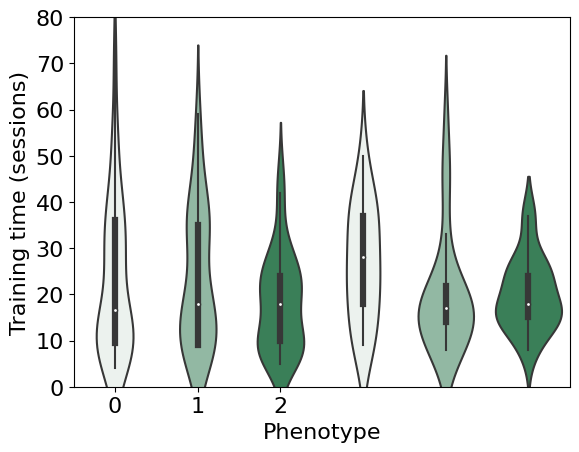

P-value for KW: 0.298
     0    1         2         3         4    5
0  1.0  1.0  1.000000  1.000000  1.000000  1.0
1  1.0  1.0  1.000000  1.000000  1.000000  1.0
2  1.0  1.0  1.000000  0.365911  1.000000  1.0
3  1.0  1.0  0.365911  1.000000  0.851726  1.0
4  1.0  1.0  1.000000  0.851726  1.000000  1.0
5  1.0  1.0  1.000000  1.000000  1.000000  1.0


In [ ]:
# --Machine learning and statistics
from scipy.stats import ttest_ind
from sklearn.metrics import f1_score
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
import scikit_posthocs as sp
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy import stats

var_1 = 'training_time ~ session_cluster'
var = 'training_time'
var = 'feedback'
var_1 = 'feedback ~ session_cluster'
# Define the model using ordinary least squares (OLS) and fit it
# data = df.dropna()
# data = df.loc[df['mouse_name'].isin(filter_mice)].dropna()
data = pd.DataFrame(new_df.groupby(['mouse_name', 'session', 'session_cluster'])[var].mean()).reset_index().dropna()
# data = pd.DataFrame(new_df.groupby(['mouse_name', 'session_cluster'])[var].mean()).reset_index().dropna()
# data = data[['session_cluster', var]]
data[var] = data[var].astype(float)

model = ols(var_1, data=data).fit()

# Perform the ANOVA
anova_table = sm.stats.anova_lm(model, typ=2)  # Type 2 ANOVA DataFrame

# print(anova_table)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(endog=data[var], groups=data['session_cluster'], alpha=0.05)
# print(tukey)

plt.rcParams.update({'font.size': 16})
sns.violinplot(x='session_cluster', y=var, data=data, palette=sns.light_palette("seagreen", 3, as_cmap=False))
# sns.barplot(x='session_cluster', y=var, data=data, palette=sns.light_palette("seagreen", 3, as_cmap=False))
# sns.scatterplot(x='part_cluster', y=var, data=data, color='black')
plt.xticks([0, 1, 2], [0, 1, 2])
plt.ylim([0, 80])
# plt.ylim([0, 4])
# plt.ylim([0.5, 1])
# plt.ylim([0, 1])
plt.xlabel('Phenotype')
plt.ylabel('Proportion correct')
plt.ylabel('Training time (sessions)')
plt.show()

group_1 = data.loc[data['session_cluster']==0, var]
group_2 = data.loc[data['session_cluster']==1, var]
group_3 = data.loc[data['session_cluster']==2, var]
group_4 = data.loc[data['session_cluster']==3, var]
group_5 = data.loc[data['session_cluster']==4, var]
group_6 = data.loc[data['session_cluster']==5, var]

# stat, p_value = stats.kruskal(group_1, group_2, group_3, group_4)
stat, p_value = stats.kruskal(group_1, group_2, group_3)
# stat, p_value = stats.kruskal(group_1, group_2, group_3, group_4, group_5)
stat, p_value = stats.kruskal(group_1, group_2, group_3, group_4, group_5, group_6)
# stat, p_value = stats.kruskal(group_1, group_2)

print(f"P-value for KW: {p_value:.3f}")

posthoc = sp.posthoc_dunn(data.dropna(), val_col=var, group_col='session_cluster', p_adjust='bonferroni')
print(posthoc)